
Traitement de l'image 1


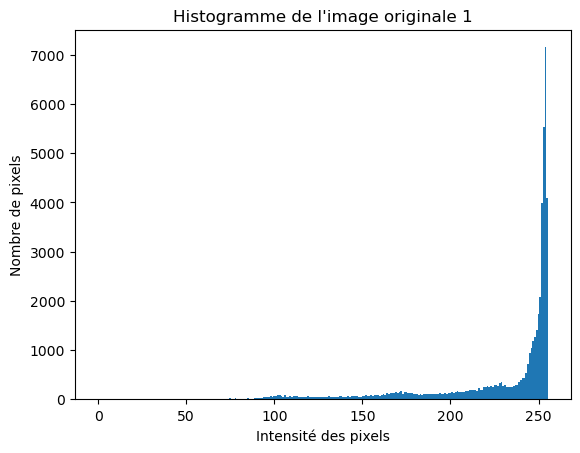

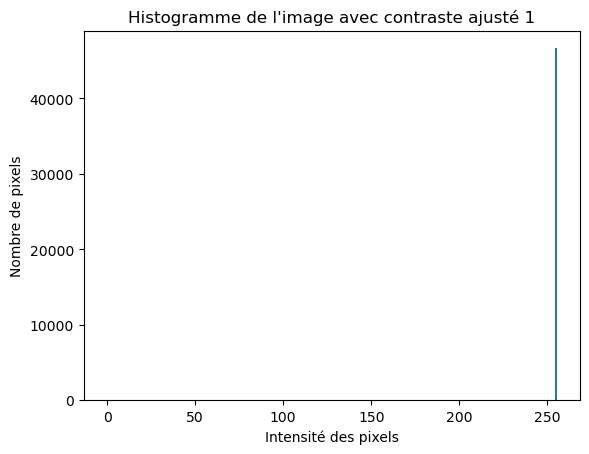

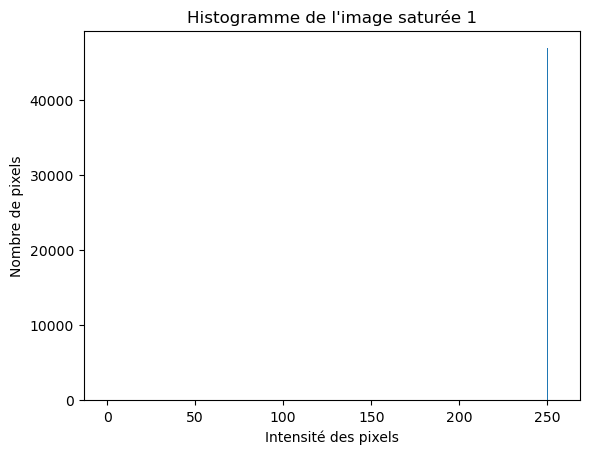

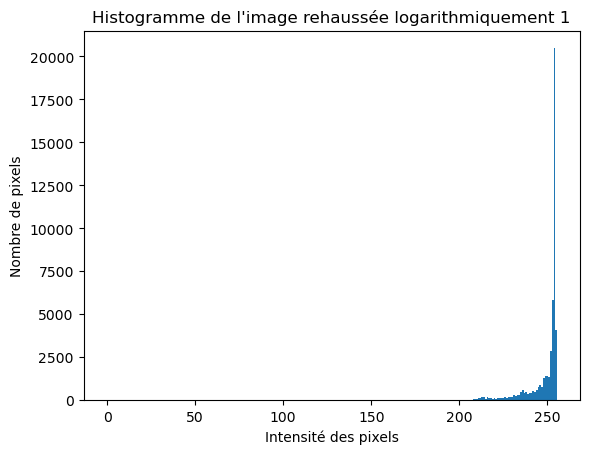

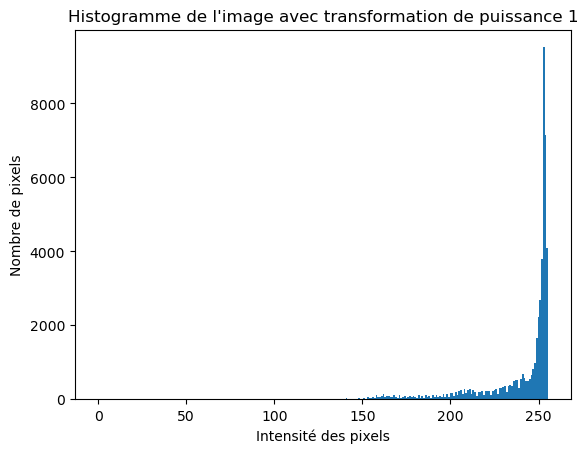

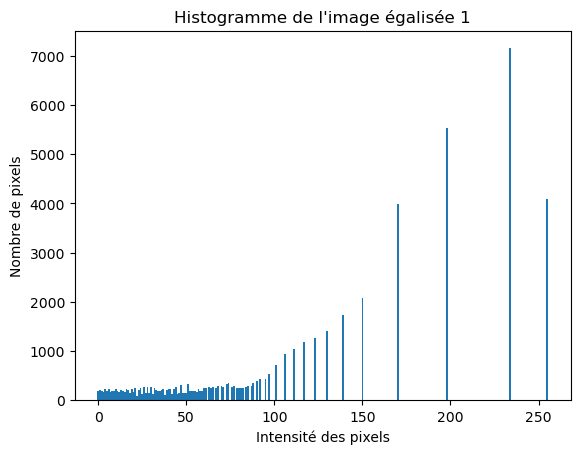

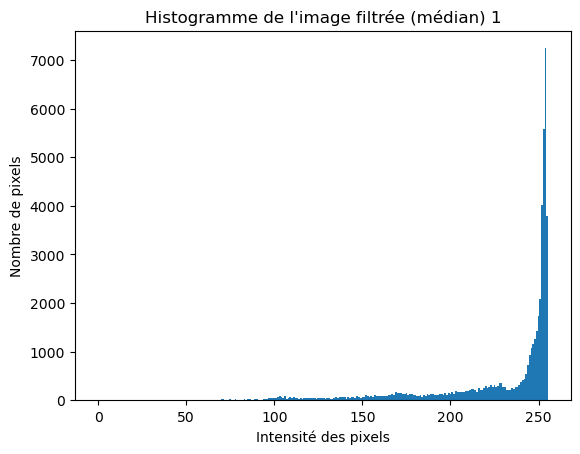

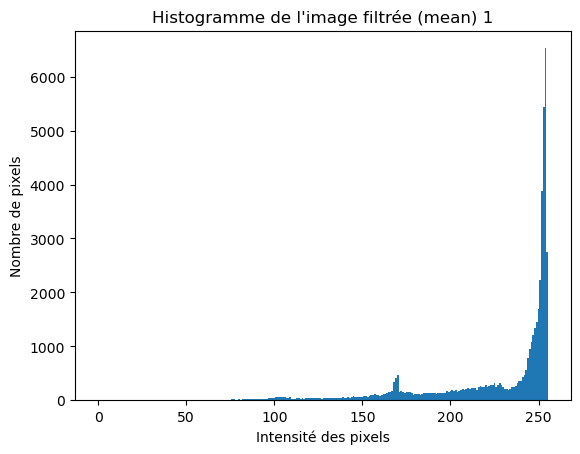

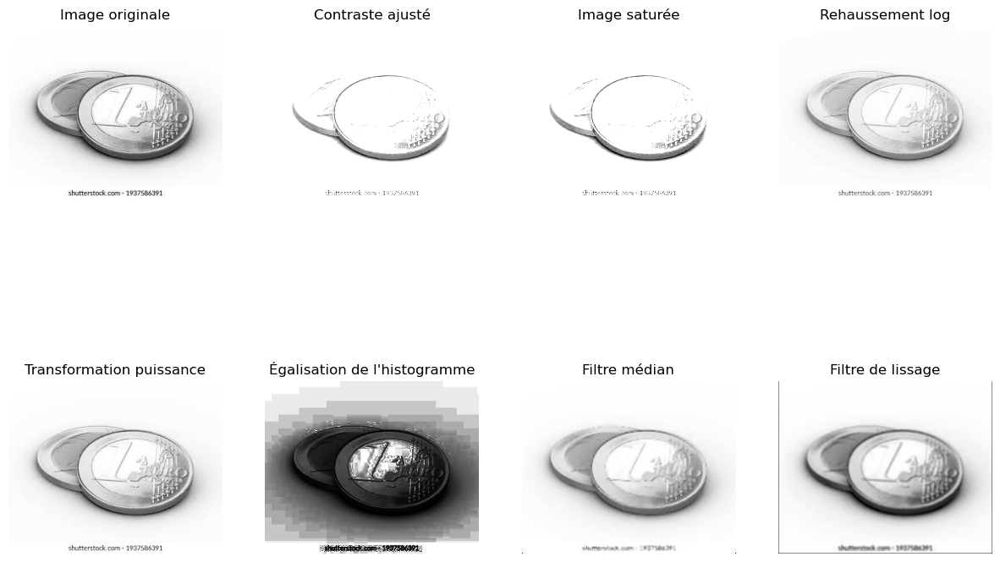


Traitement de l'image 2


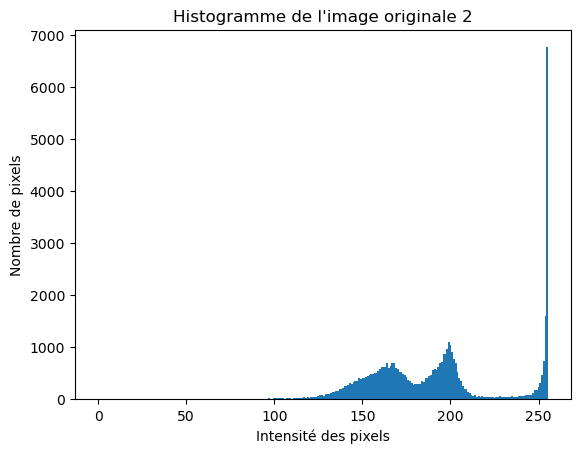

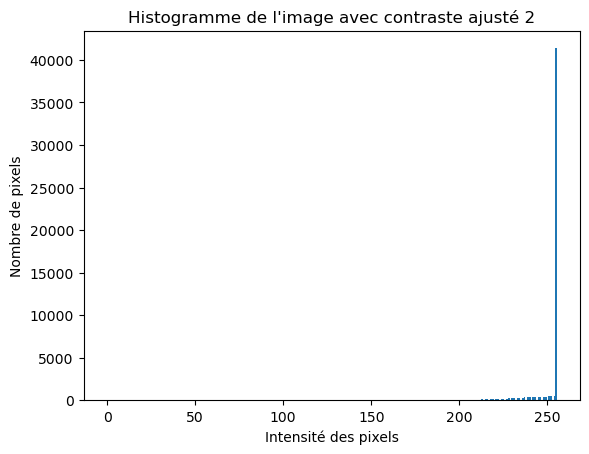

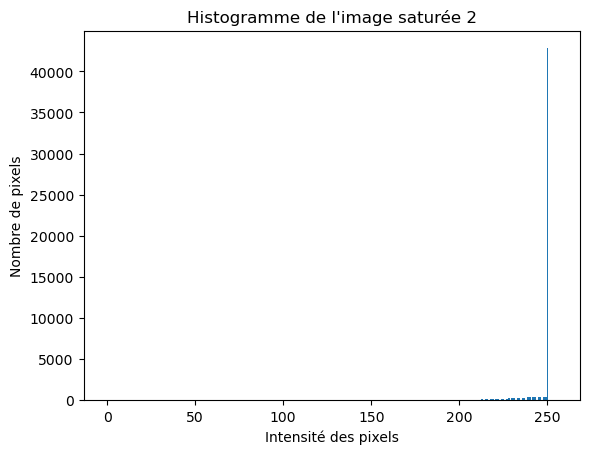

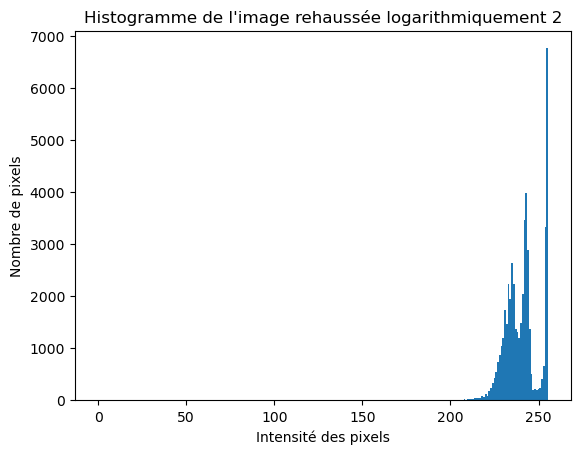

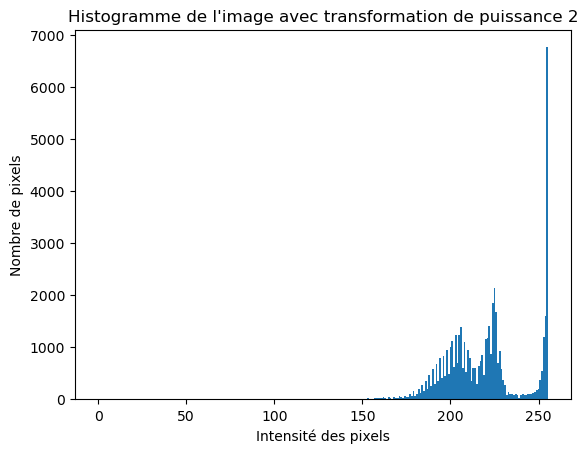

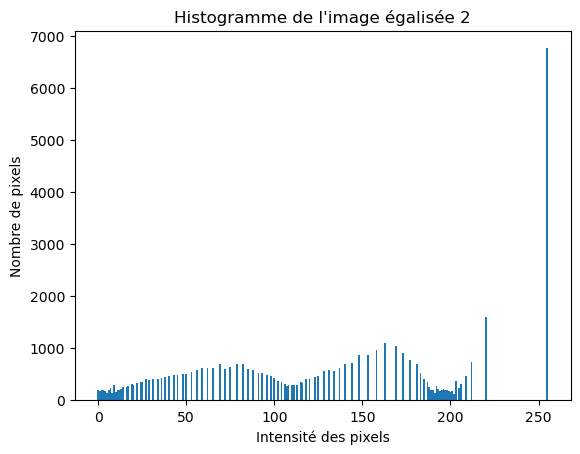

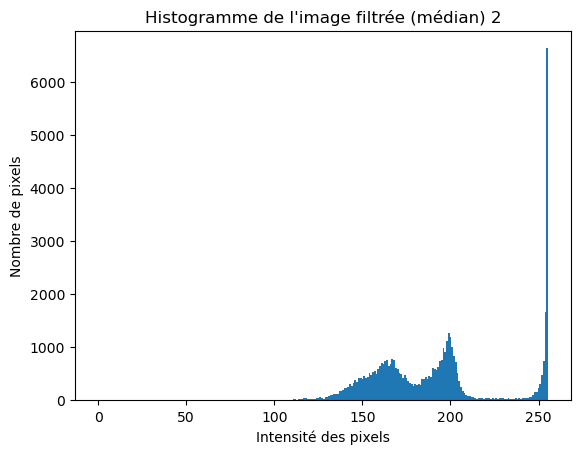

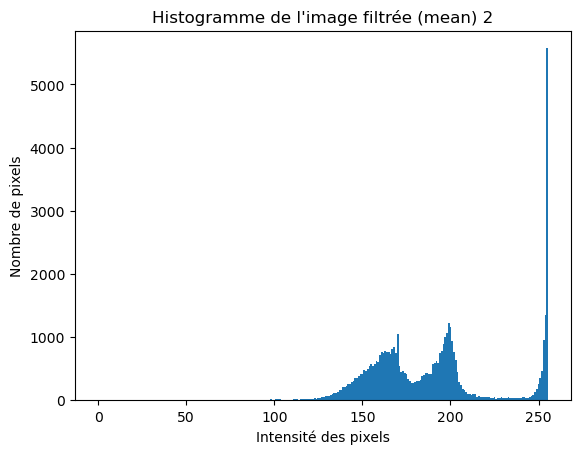

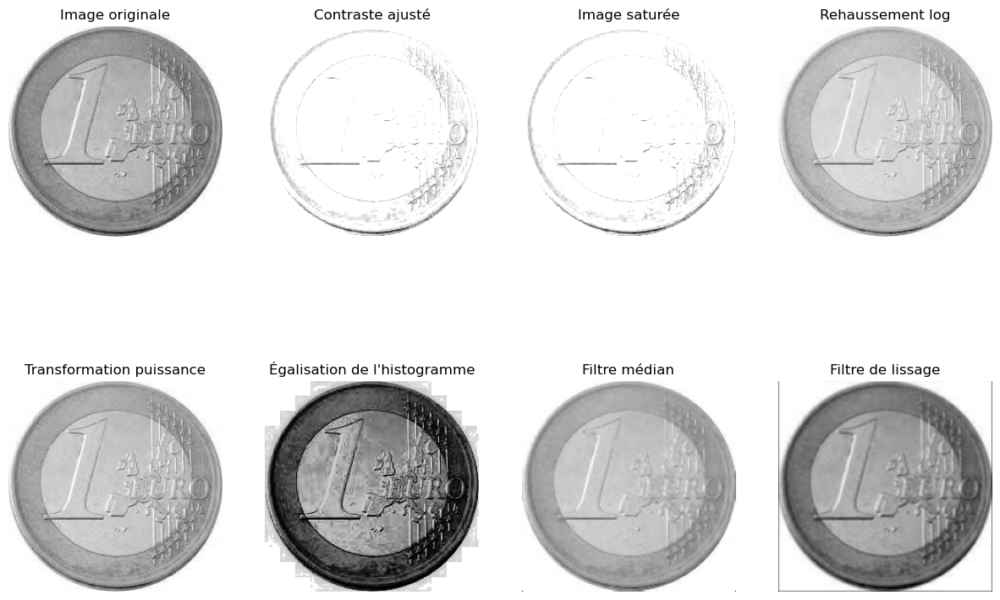


Traitement de l'image 3


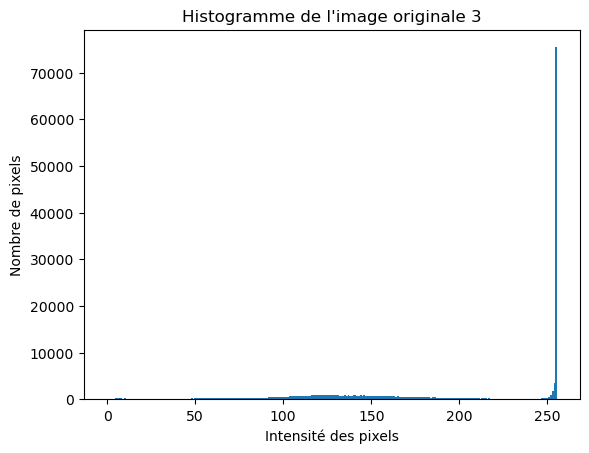

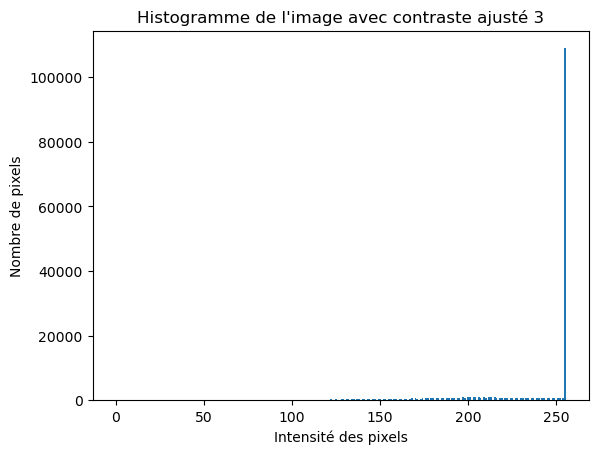

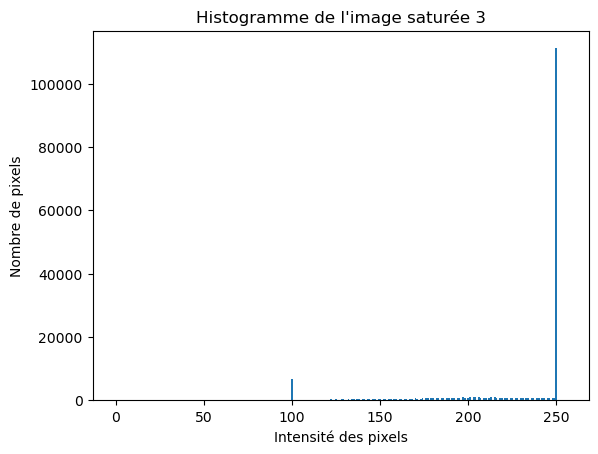

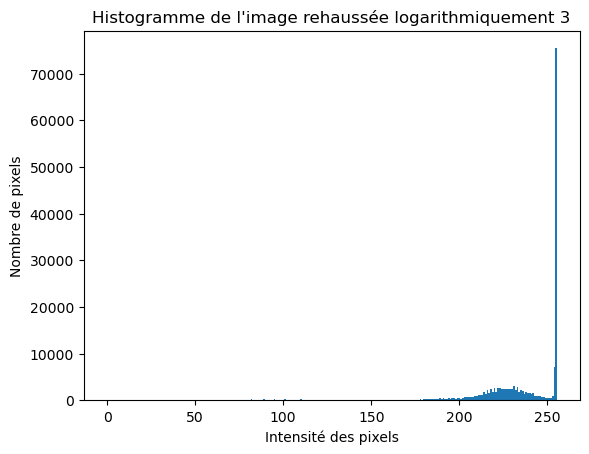

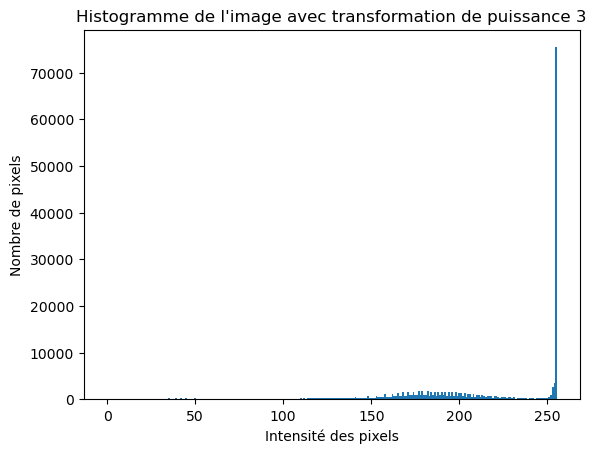

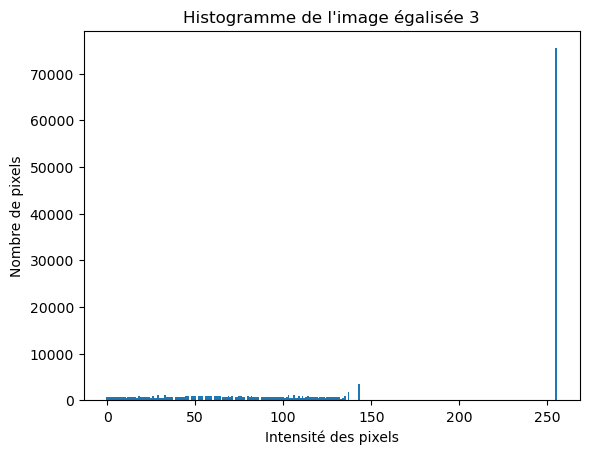

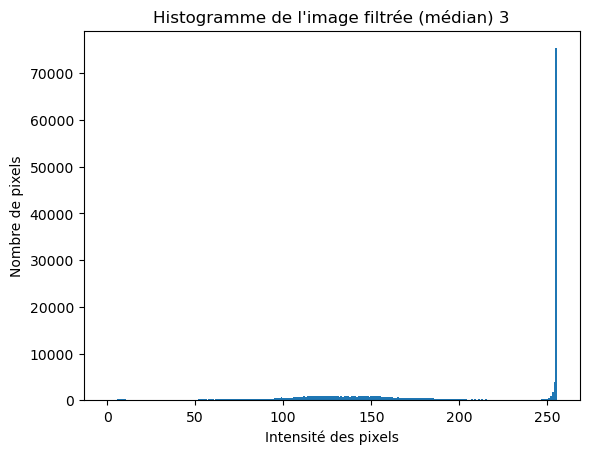

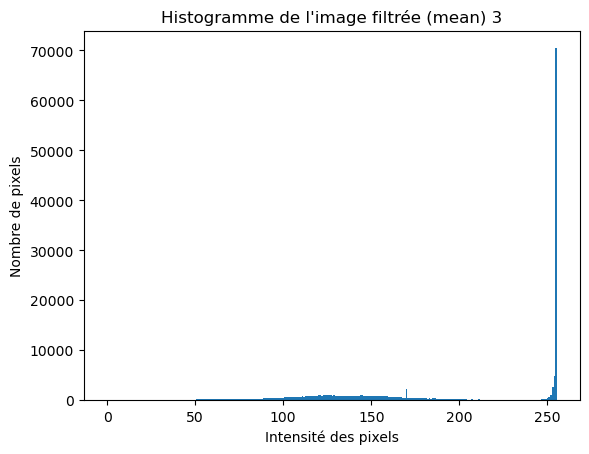

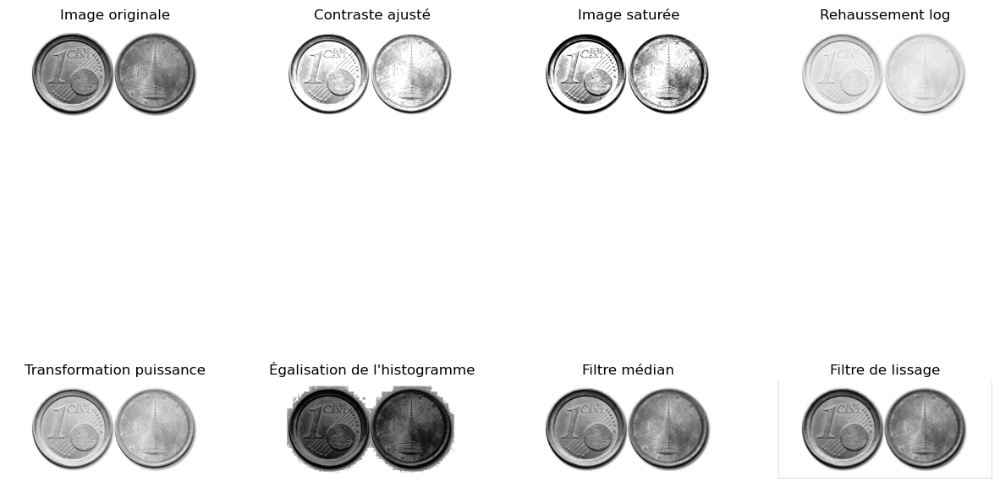


Traitement de l'image 4


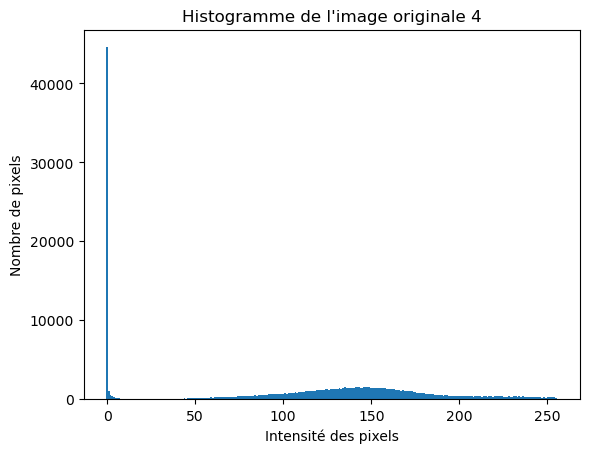

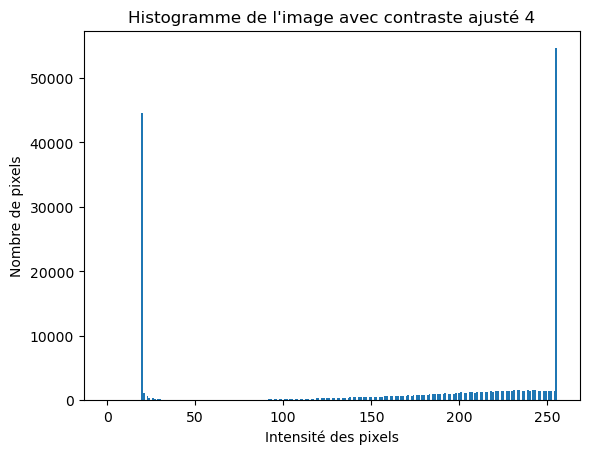

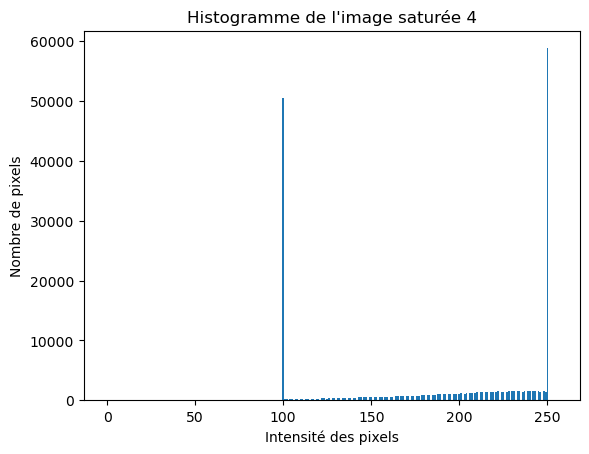

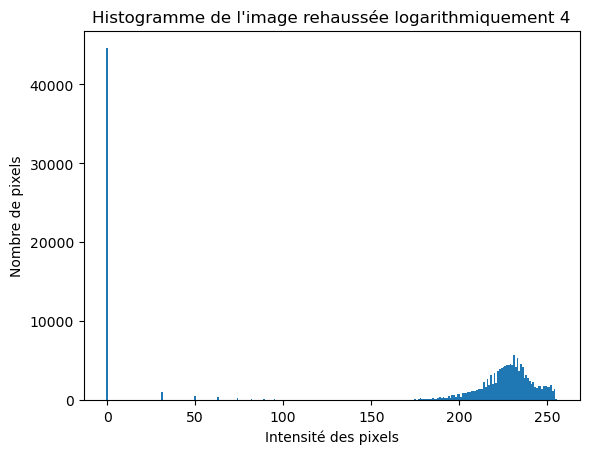

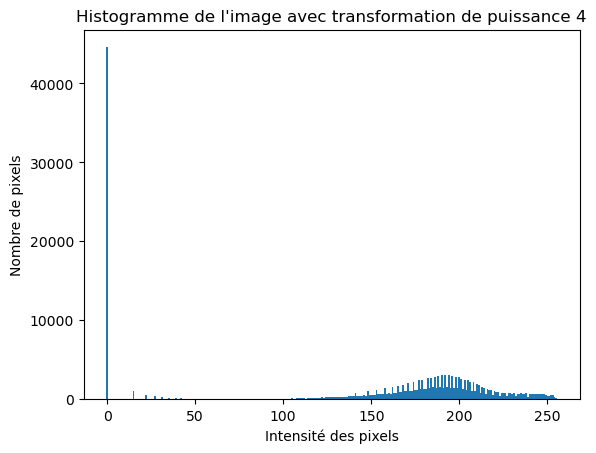

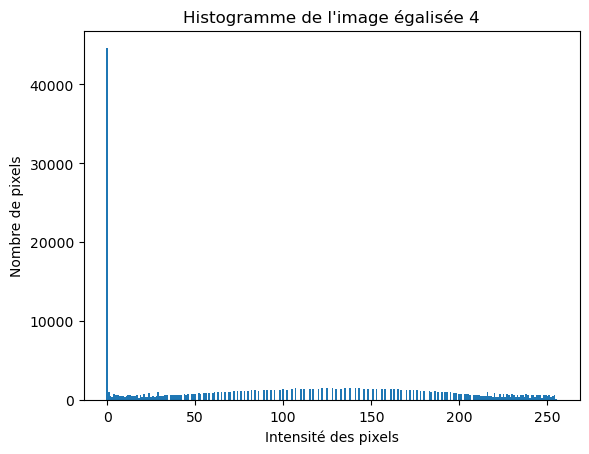

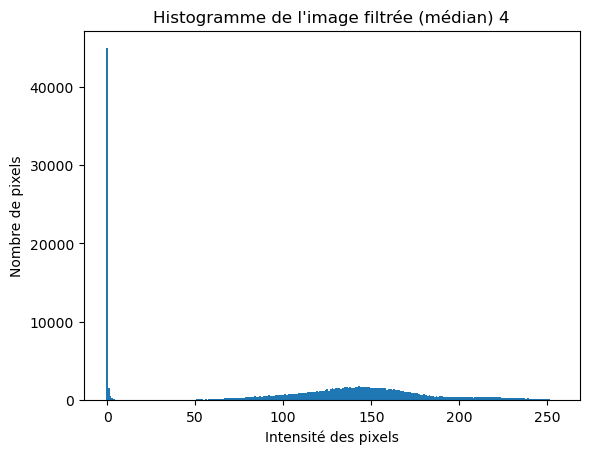

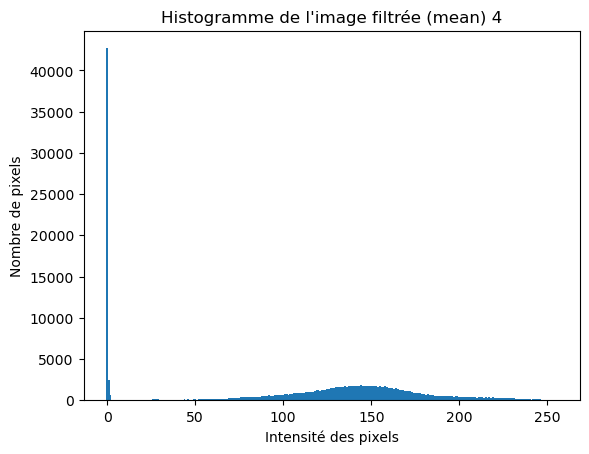

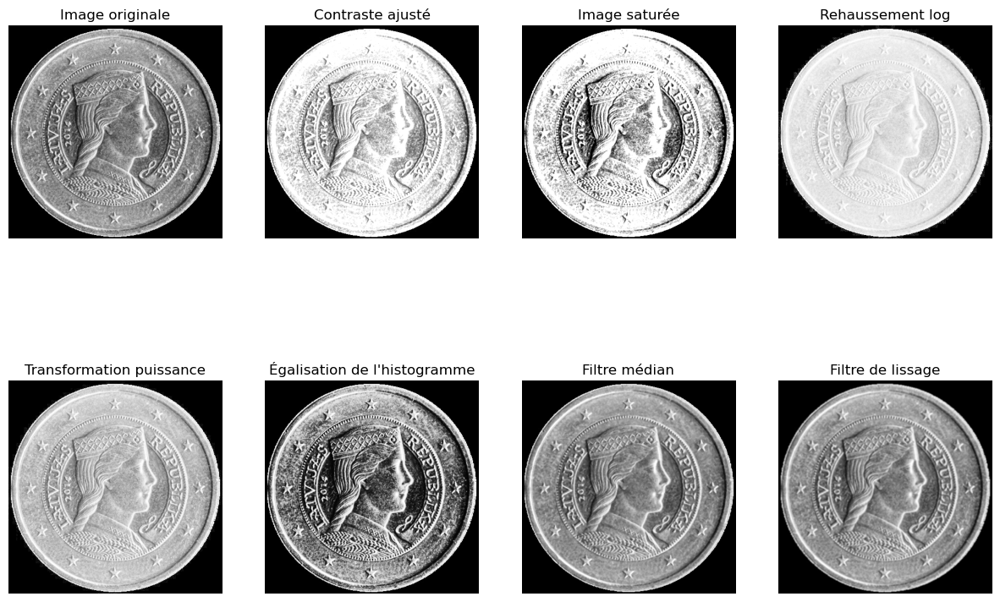


Traitement de l'image 5


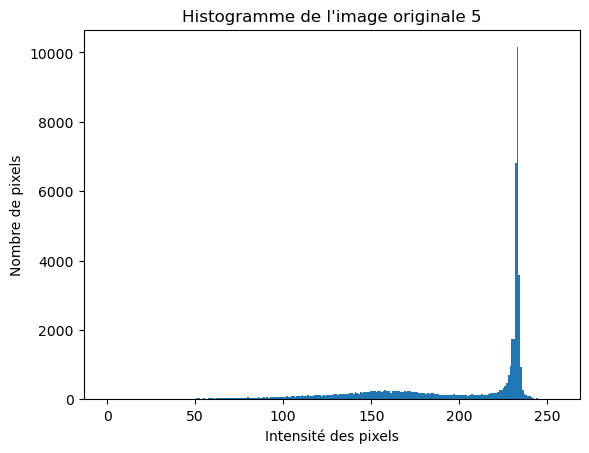

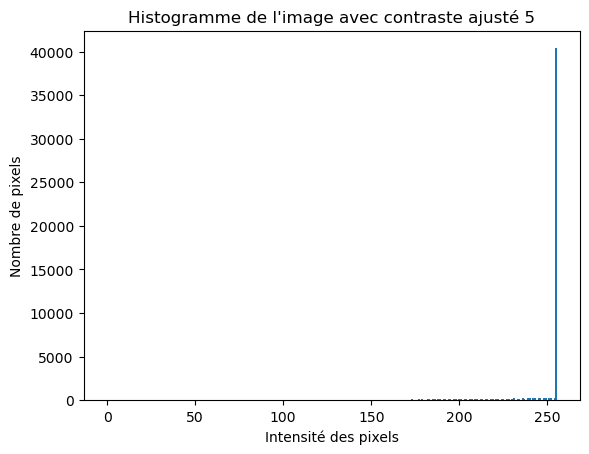

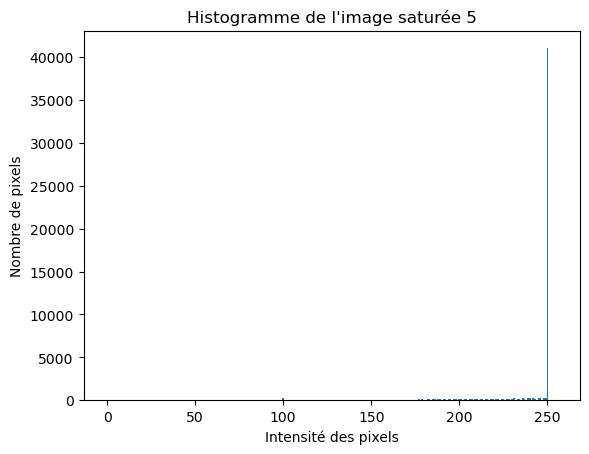

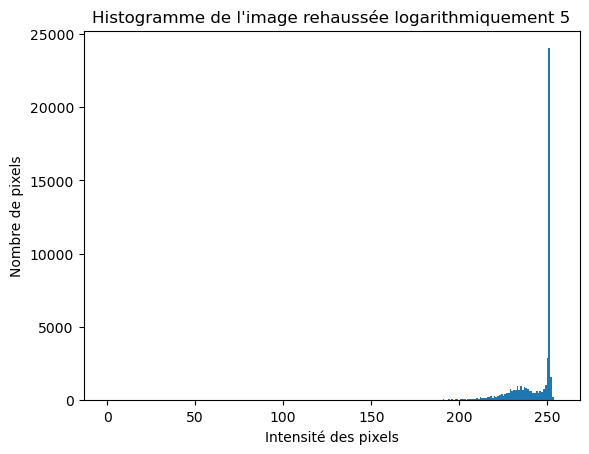

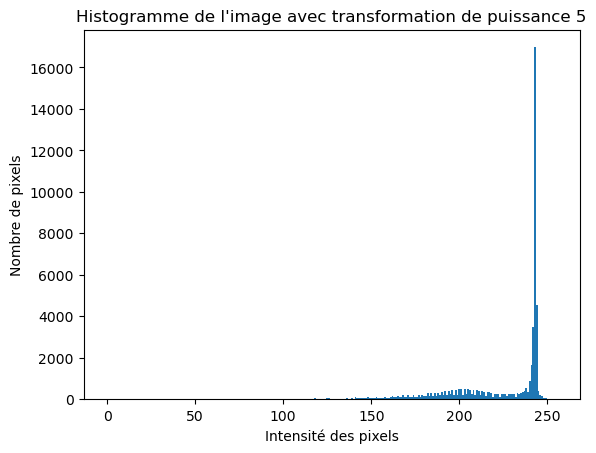

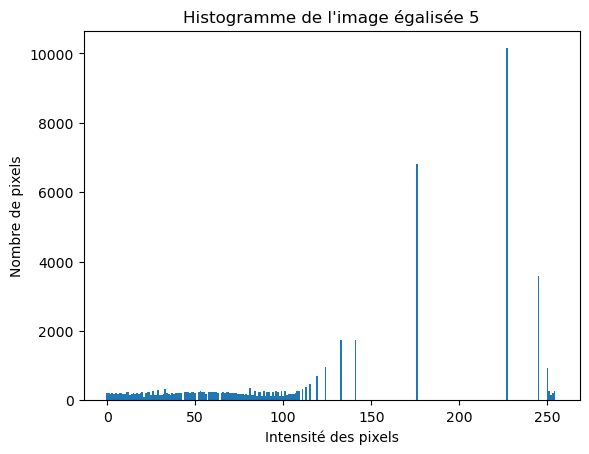

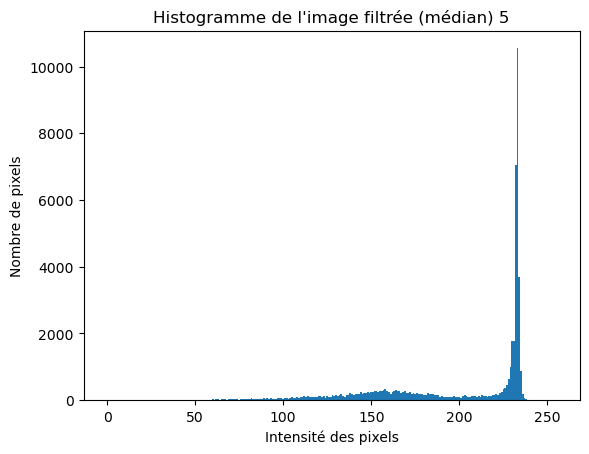

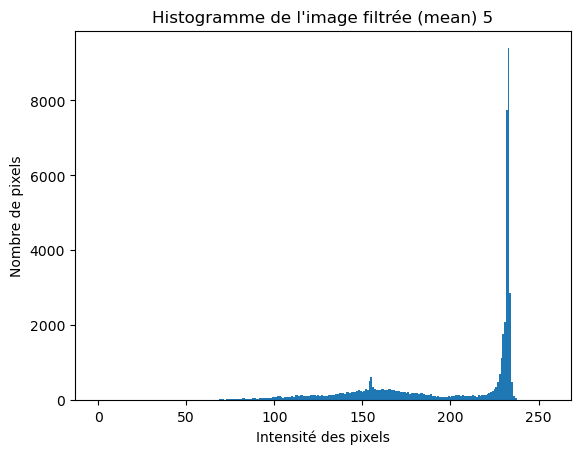

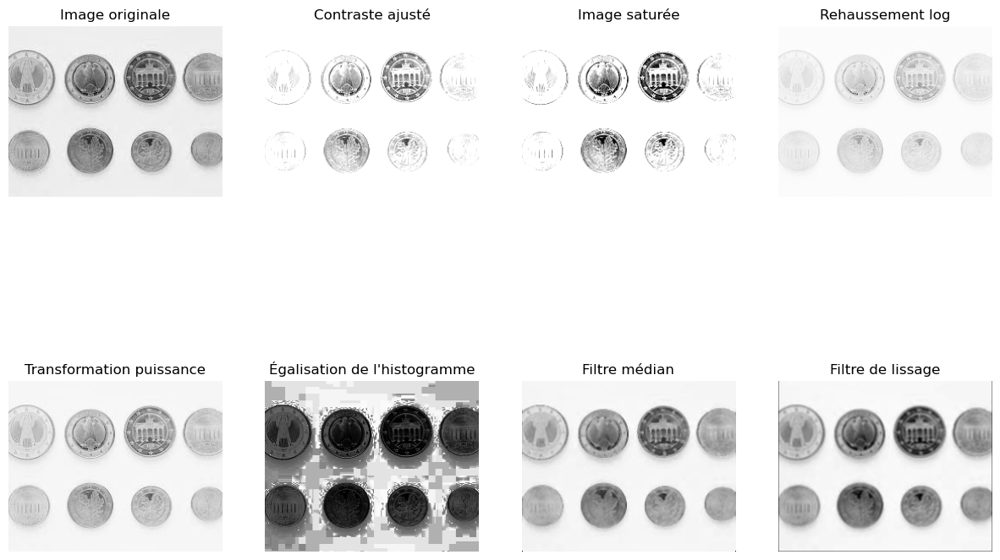


Traitement de l'image 6


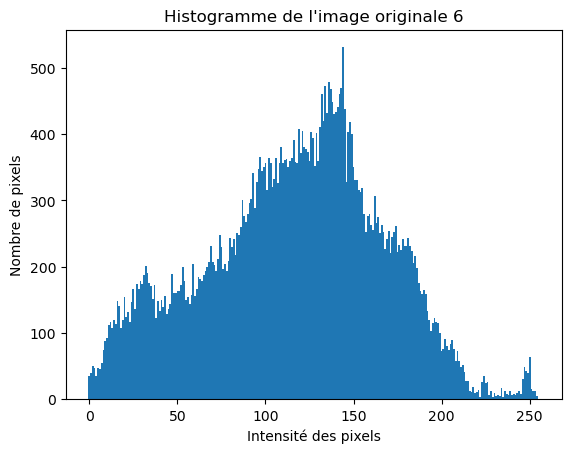

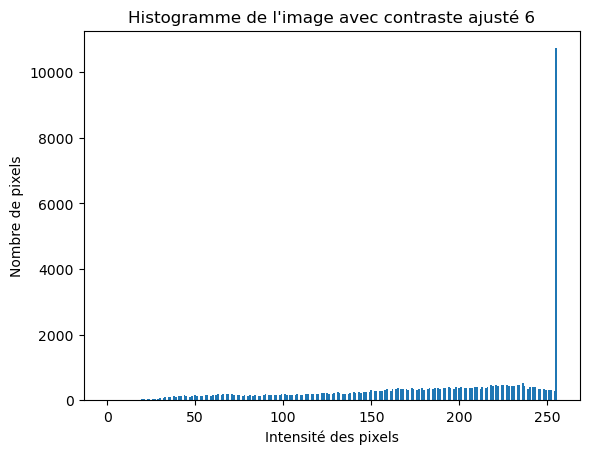

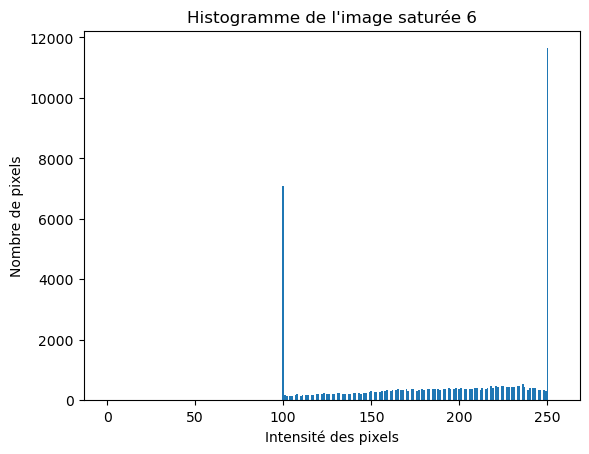

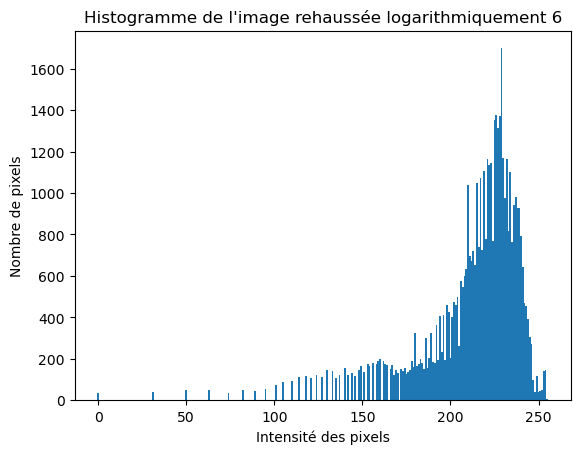

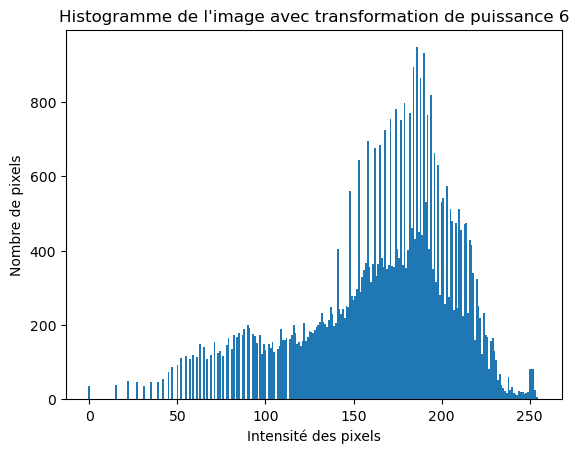

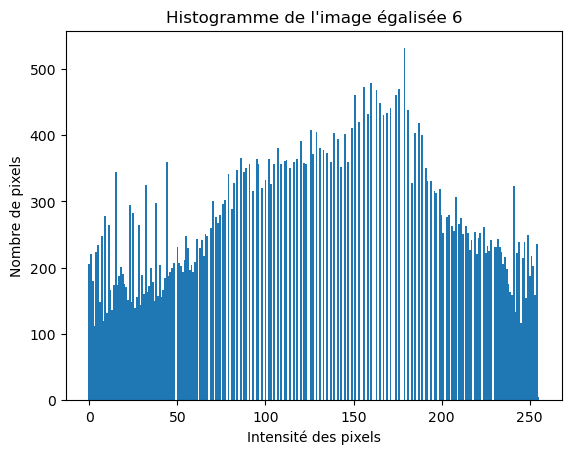

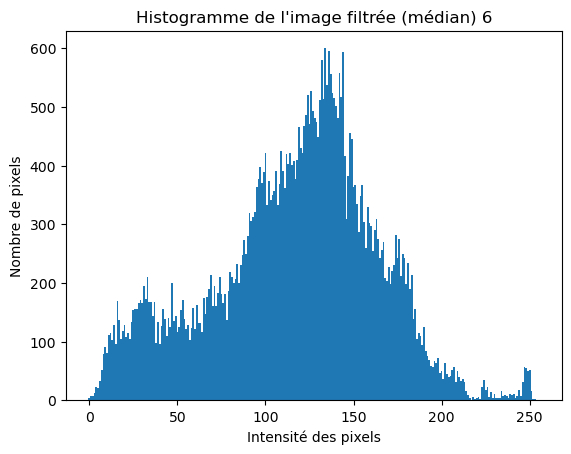

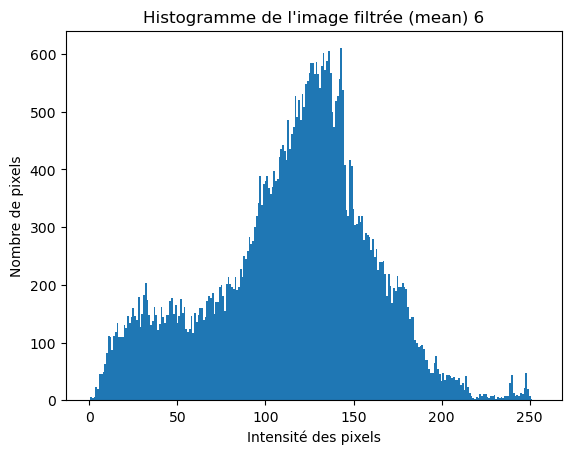

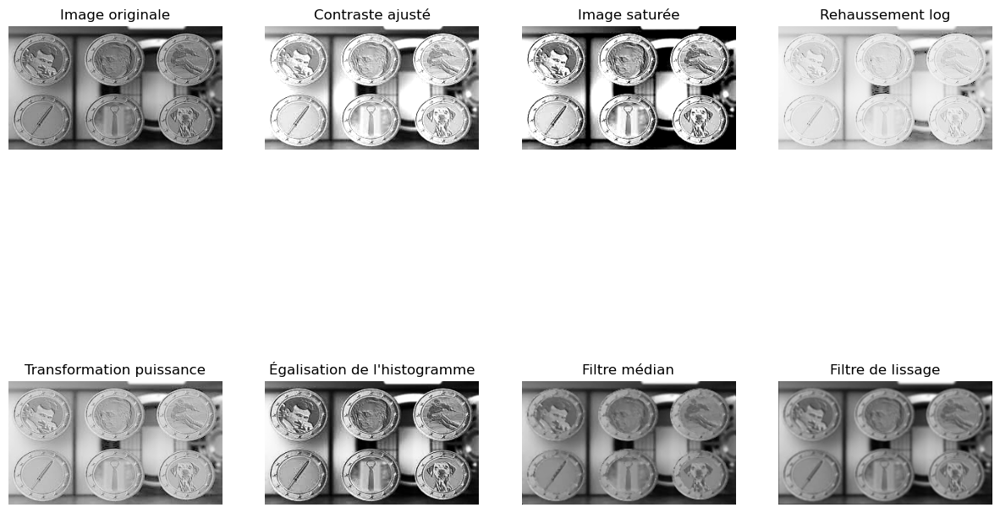


Traitement de l'image 7


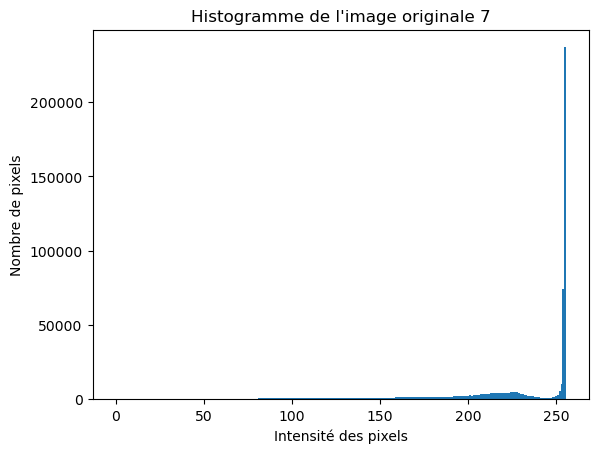

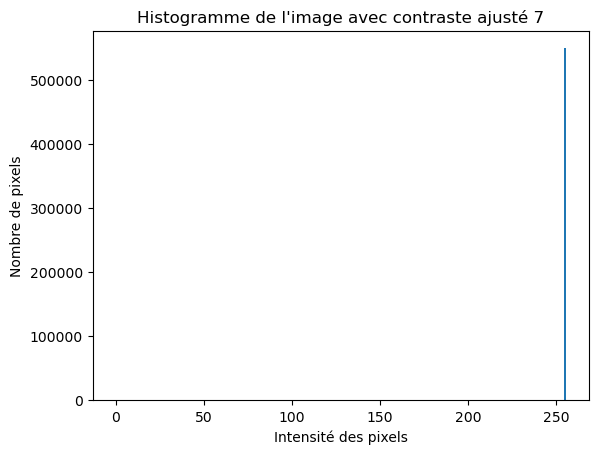

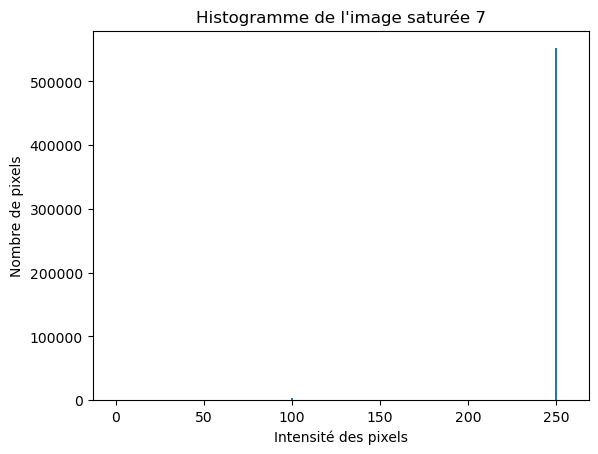

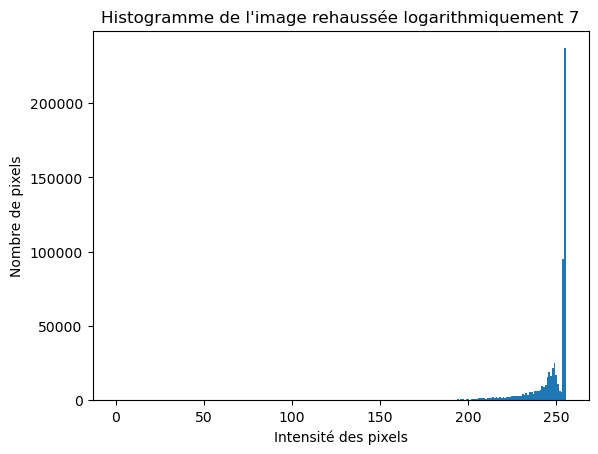

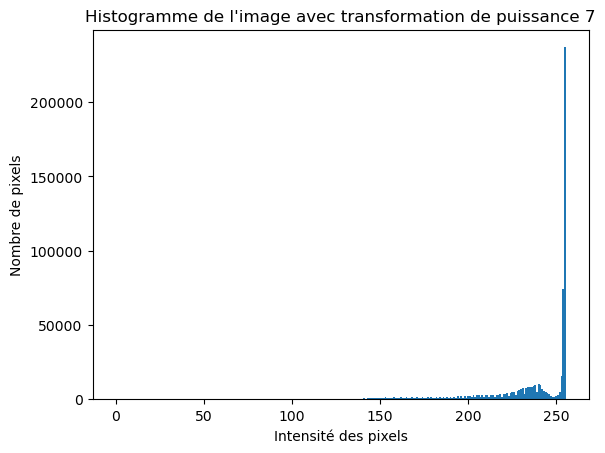

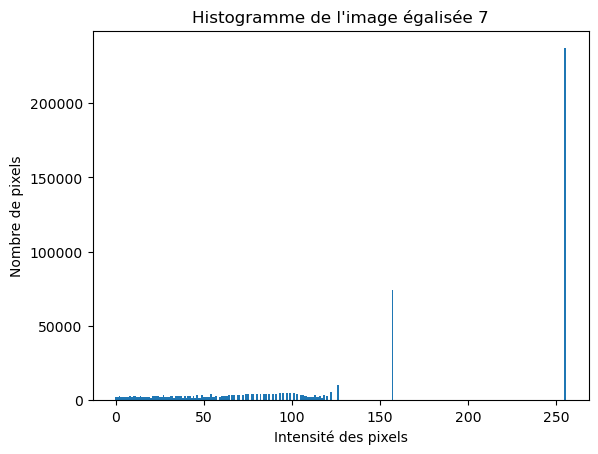

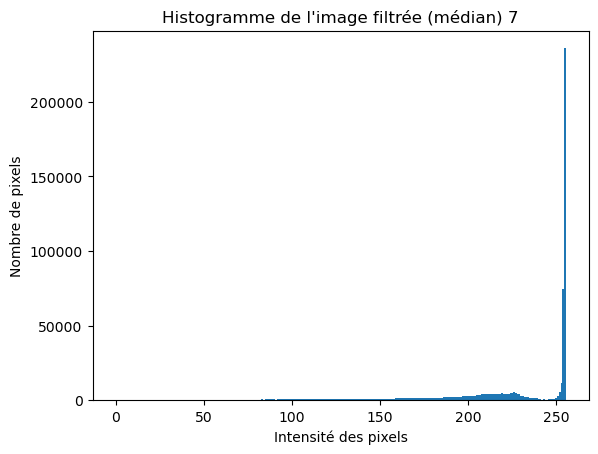

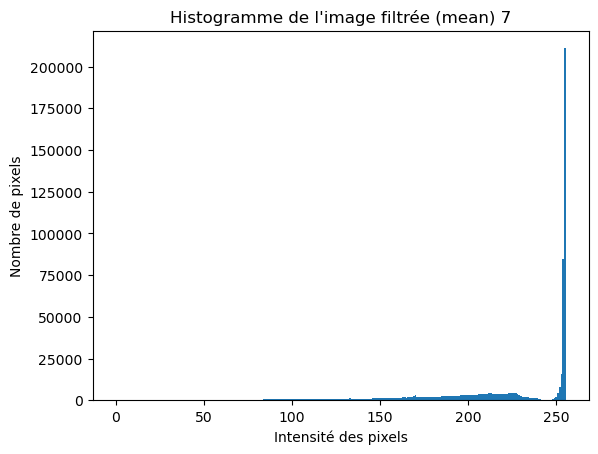

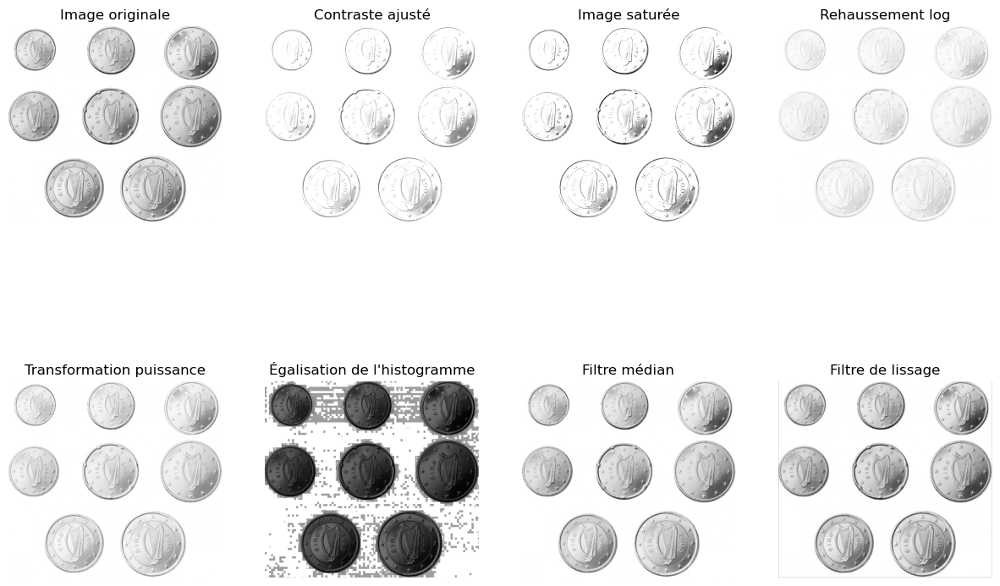


Traitement de l'image 8


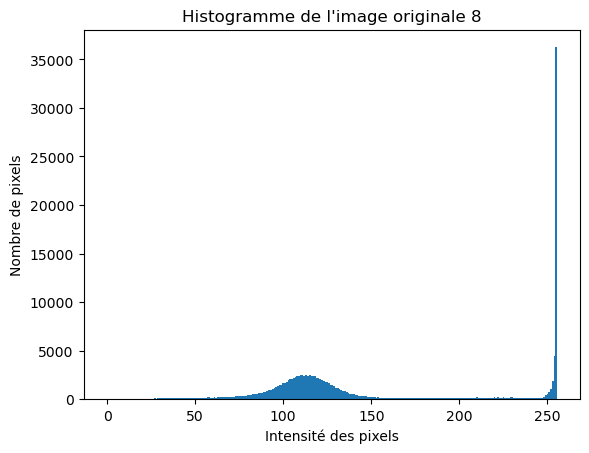

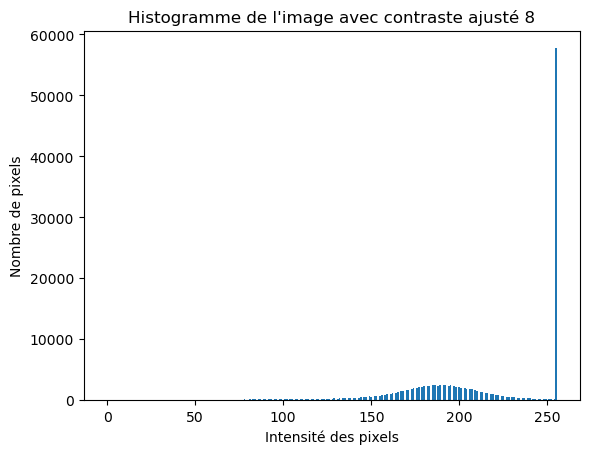

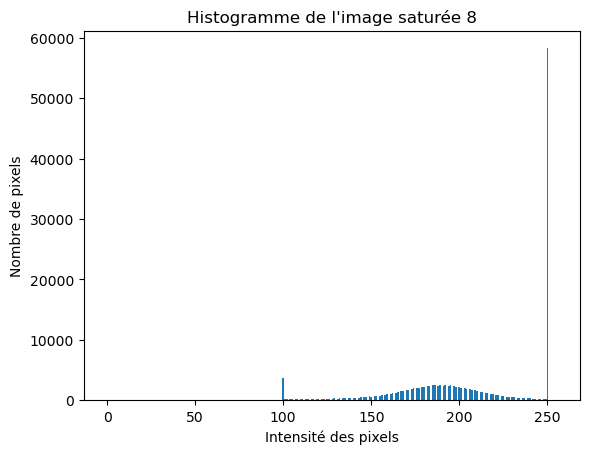

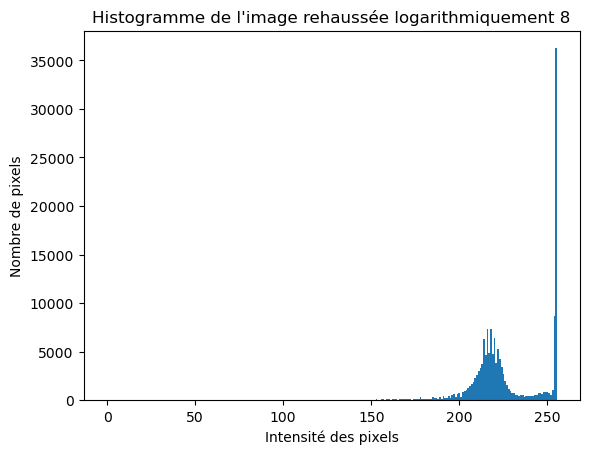

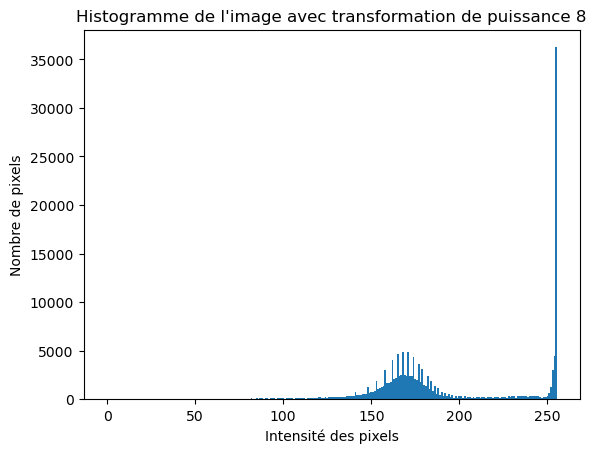

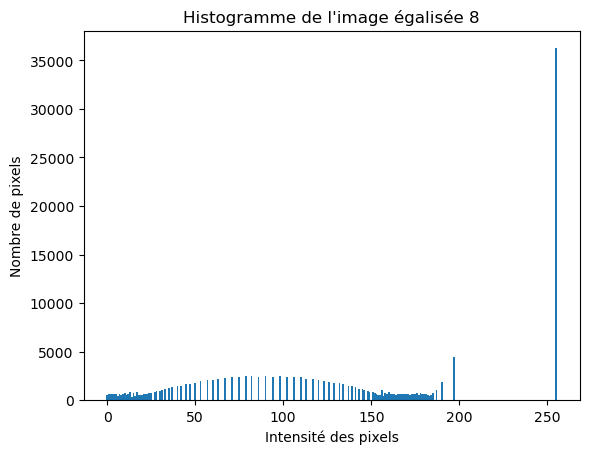

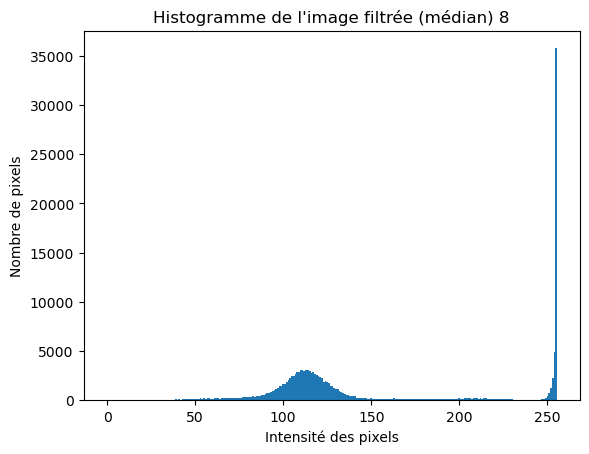

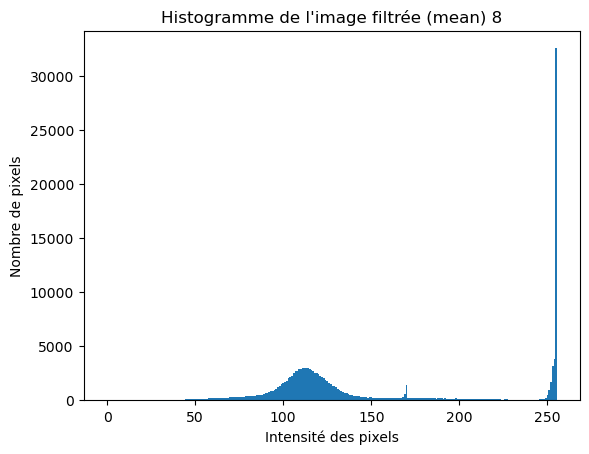

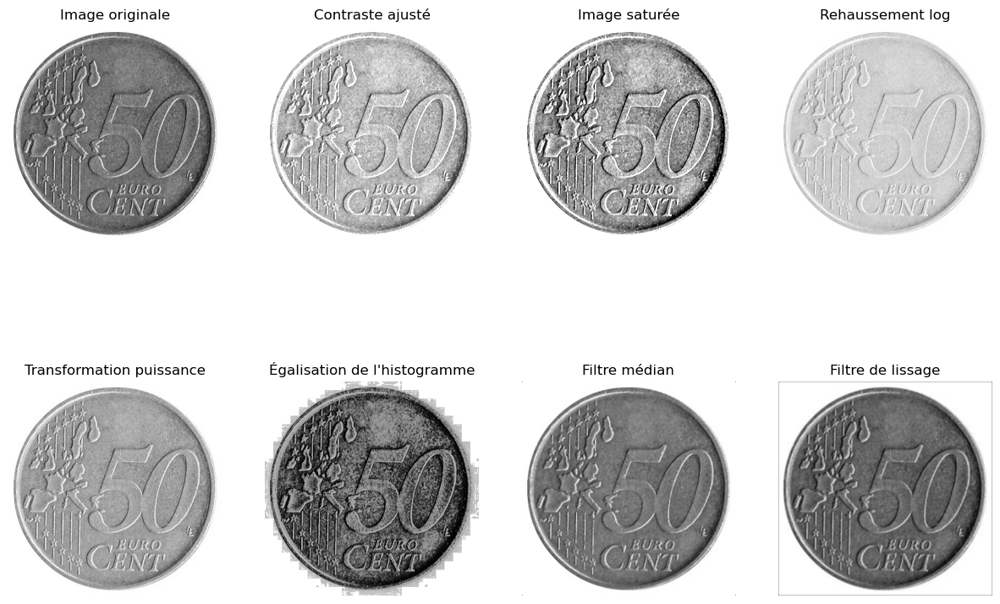


Traitement de l'image 9


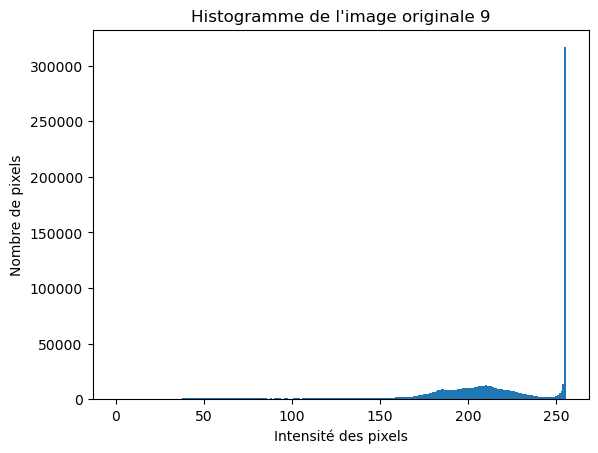

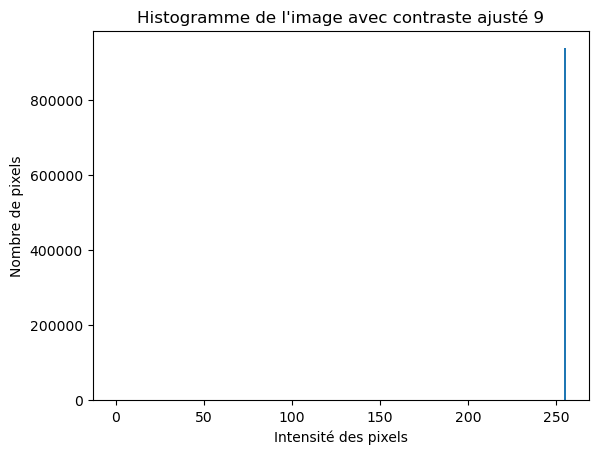

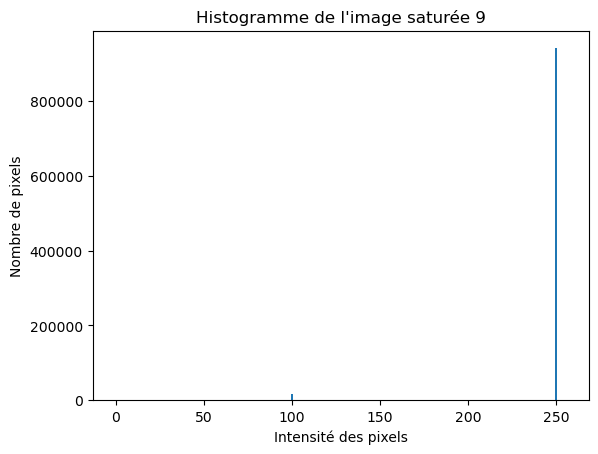

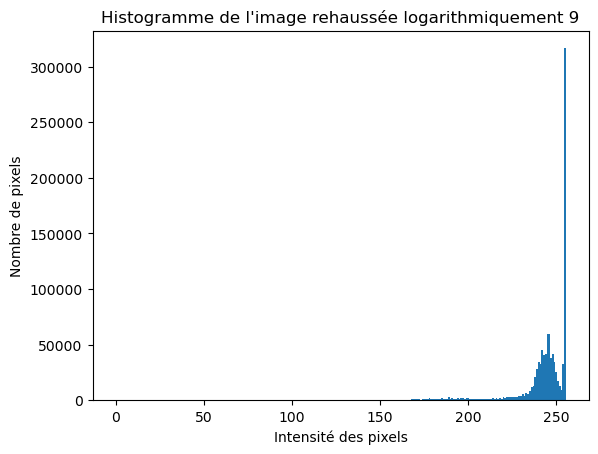

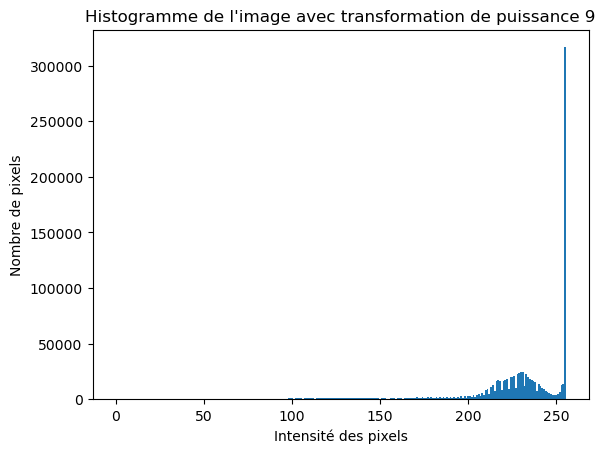

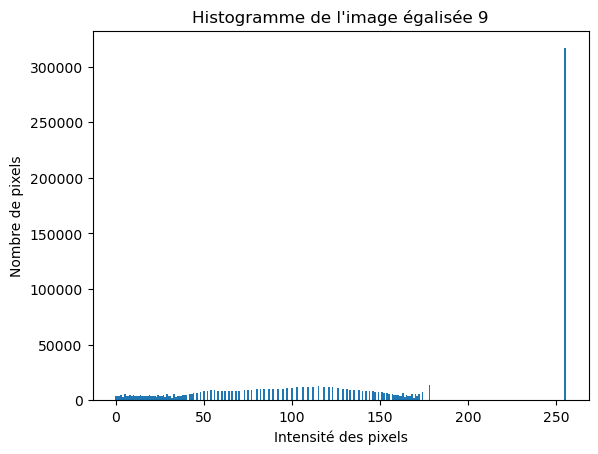

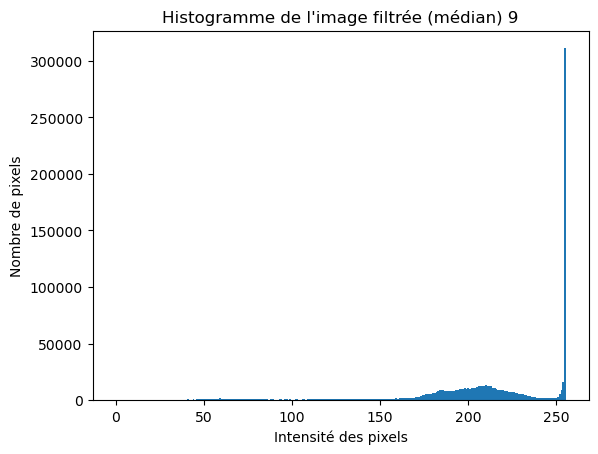

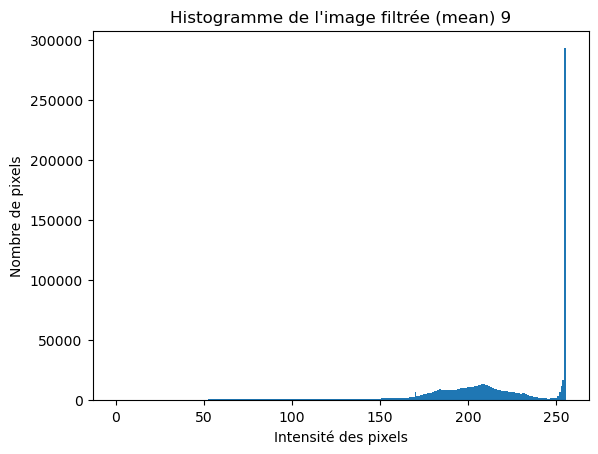

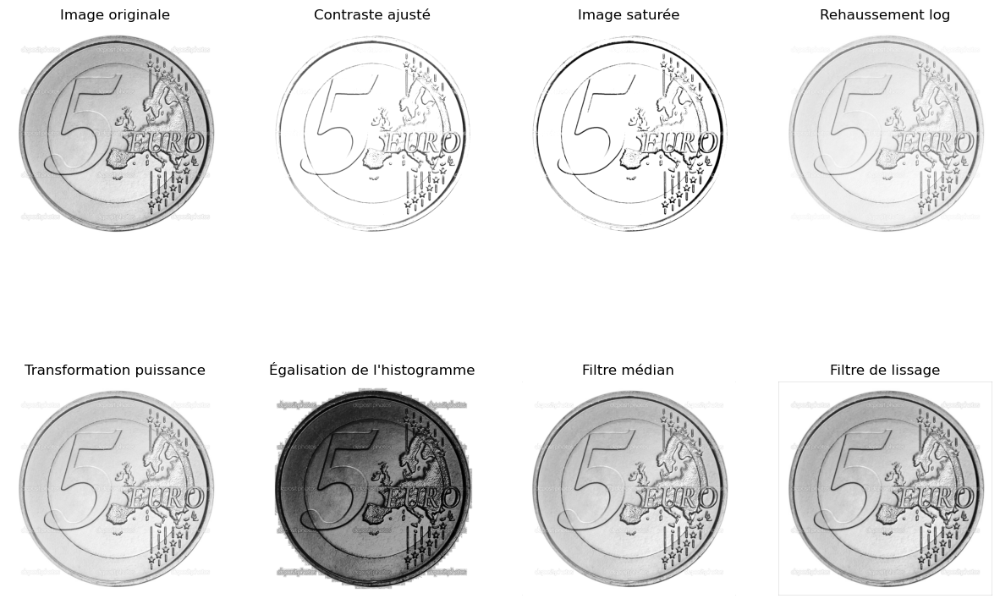


Traitement de l'image 10


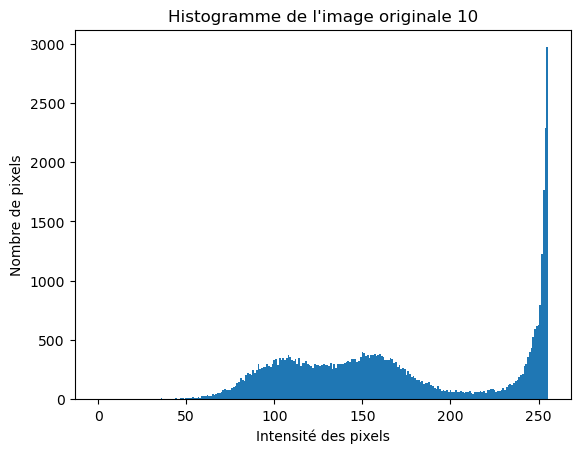

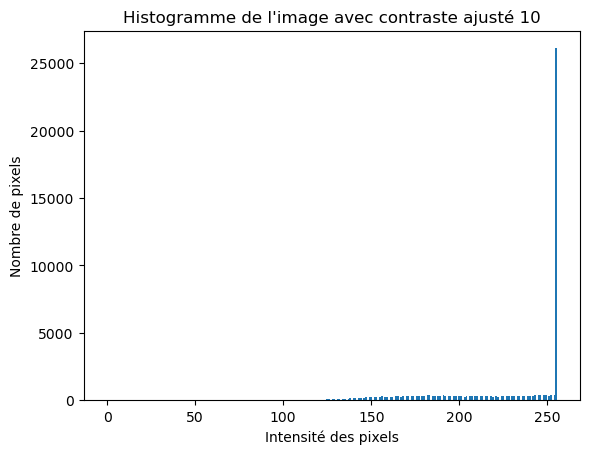

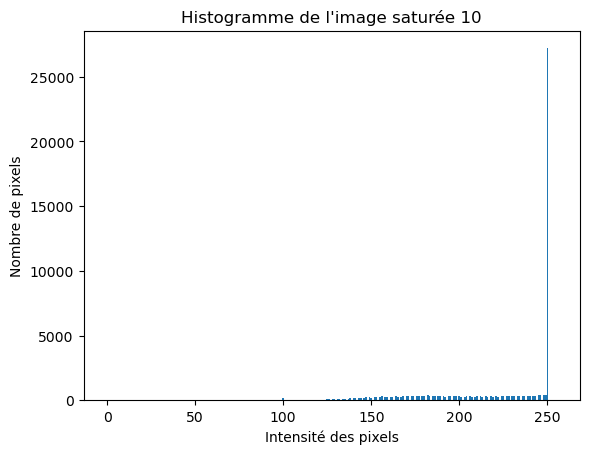

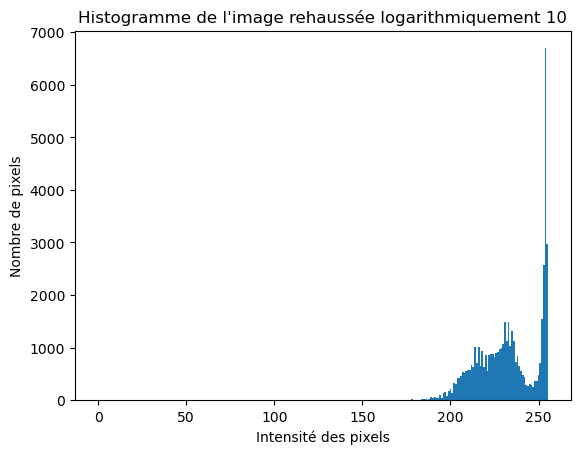

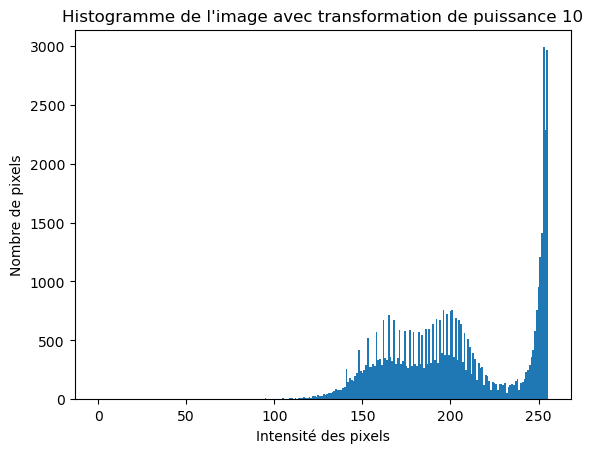

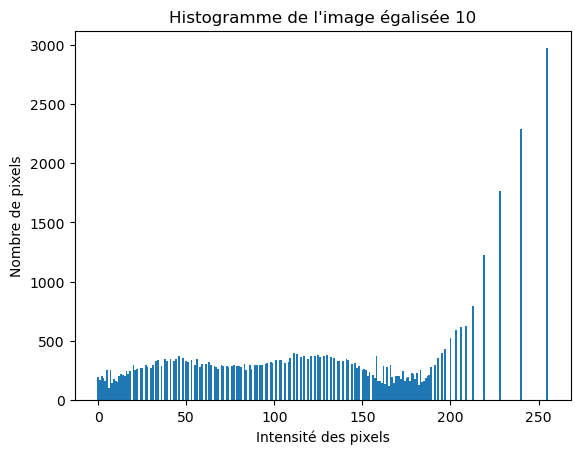

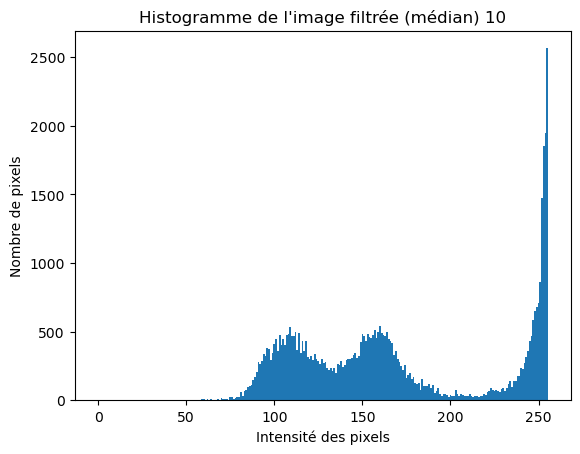

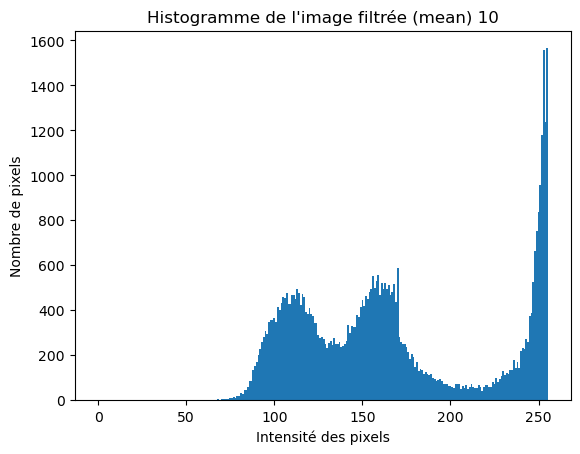

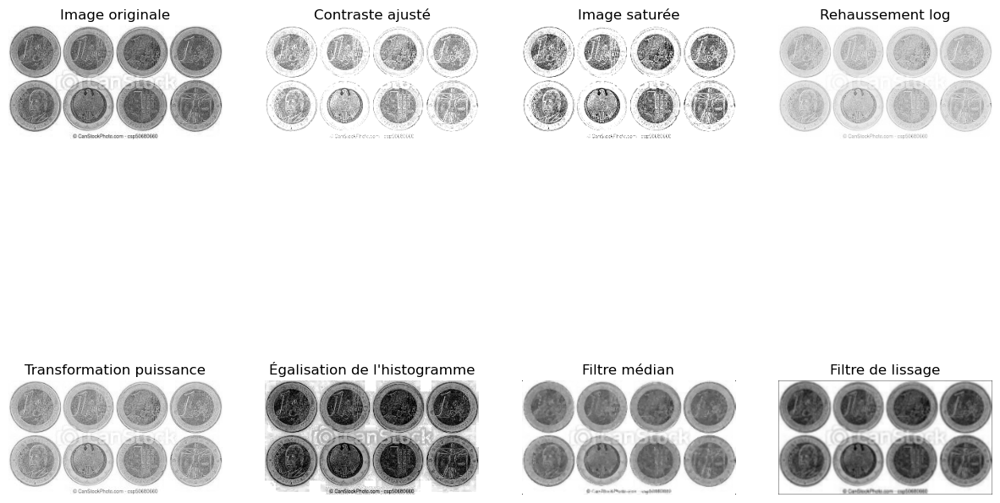

In [2]:
# Pretraitement sur quelques images du dossiers et affichage de leurs historgrammes (applictation des filtres aussi)
import numpy as np  # Bibliothèque pour les calculs numériques
import matplotlib.pyplot as plt  # Bibliothèque pour l'affichage des graphiques
import os  # Bibliothèque pour la gestion des fichiers

# 1 Charger les images 
def load_images_from_folder(folder_path, max_images=None): # charge un nombre limité d'images depuis un dossier specifique
    images = []
    count = 0
    for filename in os.listdir(folder_path): # list.dir permet de lister tous les fichiers du dossier.
        if filename.endswith(('.png', '.jpg', '.jpeg')):  # Filtrer uniquement les fichiers d'image
            img_path = os.path.join(folder_path, filename)
            img = plt.imread(img_path) # Charge image en utilisant matplotlib
            if img is not None:
                if img.ndim == 3:  # Vérifie si l'image est en couleur (3 dimensions) 
                    img = np.mean(img, axis=2).astype(np.uint8)  # Convertir l'image en niveaux de gris en calculant la moyenne des canaux de couleur.
                images.append(img) # Ajoute l'image traitée à la liste des images.
                count += 1
                if max_images is not None and count >= max_images:  # Limiter le nombre d'images chargées
                    break
    return images # Retourne images : liste des images en niveau de gris chargées sous forme de matrices numpy

# 2 Calculer l'histogramme d'une image
def compute_histogram(image):
    histogram = np.zeros(256, dtype=int) # tableau de 256 cases pour les intensités de 0 à 255 Chaque case représente le nombre de pixels qui ont cette intensité
    for pixel_value in image.ravel():
        histogram[pixel_value] += 1 # pour chaque intensité de pixel, on incrémente la valeur correspondante 
    return histogram

# 3 Afficher l'histogramme de limage original
def plot_histogram(histogram, title="Histogramme de l'image"):
    plt.figure()
    plt.bar(range(256), histogram, width=1) # trace un graphique en barres 
    plt.title(title)
    plt.xlabel('Intensité des pixels')
    plt.ylabel('Nombre de pixels')
    plt.show()

# 4 Ajuster le contraste d'une image
def adjust_contrast(image, alpha=1.2, beta=0):
    new_image = image.astype(float) * alpha + beta # formule appliquee du cours : g(I)= alpha ∙ I + beta
    new_image = np.clip(new_image, 0, 255) # limiter les pixels pour qu'ils restent dans la plage 0 255
    return new_image.astype(np.uint8)

# 5 Saturer l'image
def saturate_image(image, lower_bound=50, upper_bound=200):
    saturated_image = np.clip(image, lower_bound, upper_bound)
    return saturated_image.astype(np.uint8)

# 6 Appliquer un rehaussement logarithmique
def log_enhancement(image):
    image = image.astype(float)
    log_image = np.log1p(image)  # formule : log(1 + pixel)
    log_image = (log_image / log_image.max()) * 255  # Normaliser entre 0 et 255
    return log_image.astype(np.uint8)

# 7 Appliquer la fonction de puissance
def power_transformation(image, gamma=0.5):
    image = image.astype(float) / 255  # Normaliser entre 0 et 1
    power_image = np.power(image, gamma)  # Appliquer la transformation de puissance
    power_image = (power_image * 255).astype(np.uint8)  # Ramener à la plage 0-255
    return power_image

# 8 Appliquer l'égalisation de l'histogramme
def histogram_equalization(image):
    histogram = compute_histogram(image)
    cdf = np.cumsum(histogram)  # Calcul du cumulatif de l'histogramme
    cdf_normalized = (cdf - cdf.min()) / (cdf.max() - cdf.min()) * 255  #  fonction de répartition cumulative (CDF) normaliser
    equalized_image = cdf_normalized[image]  # Remplacer les pixels par la CDF égalisée
    return equalized_image.astype(np.uint8)

# 9 Appliquer un filtre médian
def median_filter(image, kernel_size=3):
    pad_size = kernel_size // 2
    padded_image = np.pad(image, pad_size, mode='constant', constant_values=0)
    filtered_image = np.zeros_like(image)

    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            region = padded_image[i:i + kernel_size, j:j + kernel_size]
            filtered_image[i, j] = np.median(region)
    return filtered_image

# 10 Appliquer un Filtre de lissage (mean)
def mean_filter(image, kernel_size=3):
    pad_size = kernel_size // 2
    padded_image = np.pad(image, pad_width=pad_size, mode='constant', constant_values=0)
    filtered_image = np.zeros_like(image)
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            region = padded_image[i:i + kernel_size, j:j + kernel_size]
            filtered_image[i, j] = np.mean(region)
    return filtered_image.astype(np.uint8)

def main():
    folder_path = "euro_coins"  #Chemin du dossier des images
    max_images = 10  # Nombre maximal d'images à charger
    images = load_images_from_folder(folder_path, max_images=max_images)
    
    for i, image in enumerate(images): # Pour chaque image : 
        print(f"\nTraitement de l'image {i+1}")
        
        # Affichage de l'histogramme de l'image d'origine
        histogram = compute_histogram(image)
        plot_histogram(histogram, title=f"Histogramme de l'image originale {i+1}")
        
        # Ajustement du contraste
        contrasted_image = adjust_contrast(image, alpha=1.5, beta=20)
        contrasted_histogram = compute_histogram(contrasted_image)
        plot_histogram(contrasted_histogram, title=f"Histogramme de l'image avec contraste ajusté {i+1}")
        
        # Saturation de l'image
        saturated_image = saturate_image(contrasted_image, lower_bound=100, upper_bound=250)
        saturated_histogram = compute_histogram(saturated_image)
        plot_histogram(saturated_histogram, title=f"Histogramme de l'image saturée {i+1}")
        
        # Rehaussement logarithmique
        log_image = log_enhancement(image)
        log_histogram = compute_histogram(log_image)
        plot_histogram(log_histogram, title=f"Histogramme de l'image rehaussée logarithmiquement {i+1}")
        
        # Transformation par puissance
        power_image = power_transformation(image, gamma=0.5)
        power_histogram = compute_histogram(power_image)
        plot_histogram(power_histogram, title=f"Histogramme de l'image avec transformation de puissance {i+1}")
        
        # Égalisation de l'histogramme
        equalized_image = histogram_equalization(image)
        equalized_histogram = compute_histogram(equalized_image)
        plot_histogram(equalized_histogram, title=f"Histogramme de l'image égalisée {i+1}")
        
        # Filtre médian
        median_filtered_image = median_filter(image, kernel_size=3)
        median_histogram = compute_histogram(median_filtered_image)
        plot_histogram(median_histogram, title=f"Histogramme de l'image filtrée (médian) {i+1}")
        
         # Filtre mean
        mean_filtered_image = mean_filter(image, kernel_size=3)
        mean_histogram = compute_histogram(mean_filtered_image)
        plot_histogram(mean_histogram, title=f"Histogramme de l'image filtrée (mean) {i+1}")
        
        # Affichage des images avant et après les traitements
        plt.figure(figsize=(15, 10))
        plt.subplot(2, 4, 1)
        plt.title("Image originale")
        plt.axis('off')
        plt.imshow(image, cmap='gray')
        
        plt.subplot(2, 4, 2)
        plt.title("Contraste ajusté")
        plt.axis('off')
        plt.imshow(contrasted_image, cmap='gray')
        
        plt.subplot(2, 4, 3)
        plt.title("Image saturée")
        plt.axis('off')
        plt.imshow(saturated_image, cmap='gray')
        
        plt.subplot(2, 4, 4)
        plt.title("Rehaussement log")
        plt.axis('off')
        plt.imshow(log_image, cmap='gray')
        
        plt.subplot(2, 4, 5)
        plt.title("Transformation puissance")
        plt.axis('off')
        plt.imshow(power_image, cmap='gray')
        
        plt.subplot(2, 4, 6)
        plt.title("Égalisation de l'histogramme")
        plt.axis('off')
        plt.imshow(equalized_image, cmap='gray')
        
        plt.subplot(2, 4, 7)
        plt.title("Filtre médian")
        plt.axis('off')
        plt.imshow(median_filtered_image, cmap='gray')
        
        plt.subplot(2, 4, 8)
        plt.title("Filtre de lissage")
        plt.axis('off')
        plt.imshow(mean_filtered_image, cmap='gray')
        plt.show()

if __name__ == "__main__":
    main()


Traitement de l'image 1


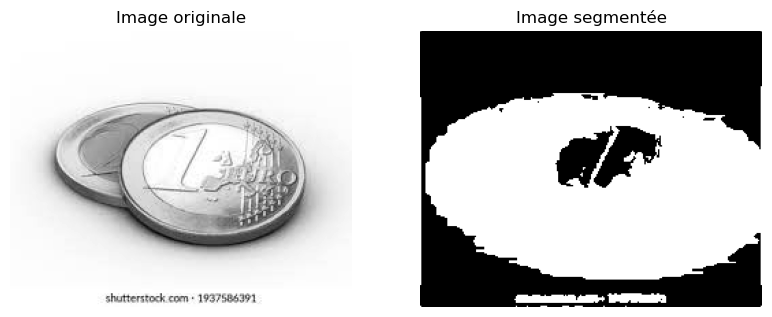


Traitement de l'image 2


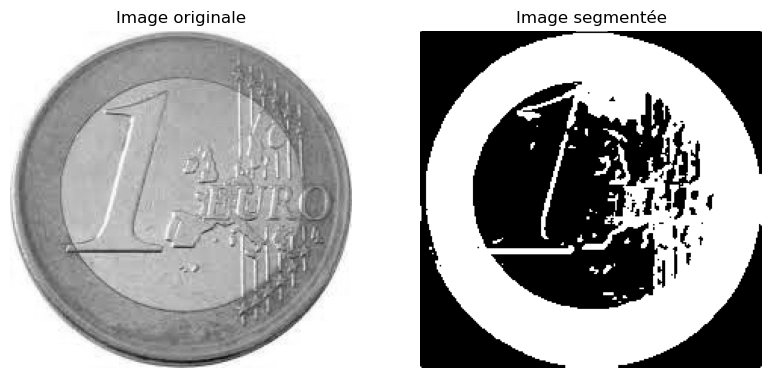


Traitement de l'image 3


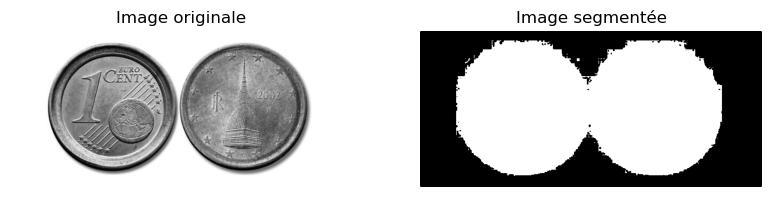


Traitement de l'image 4


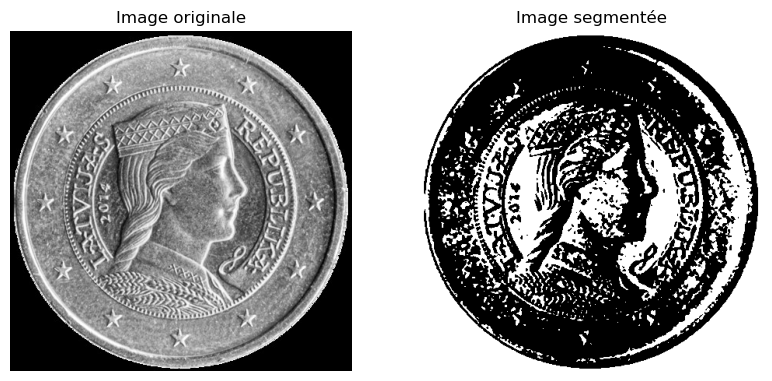


Traitement de l'image 5


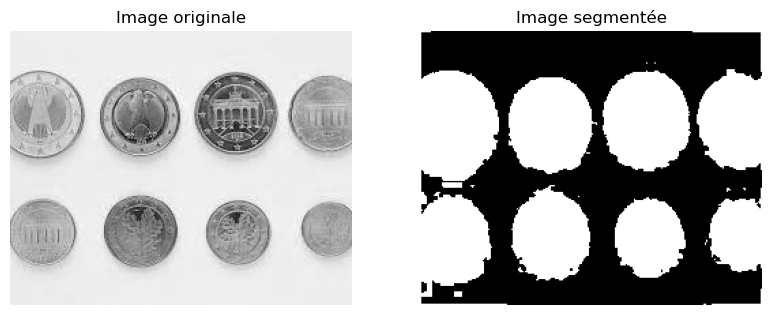


Traitement de l'image 6


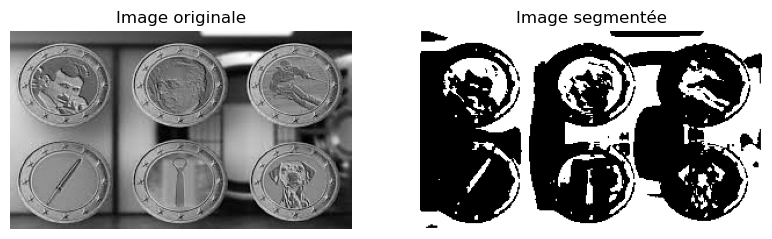


Traitement de l'image 7


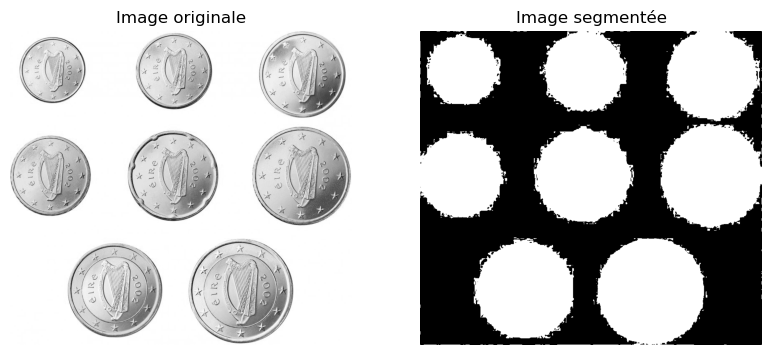


Traitement de l'image 8


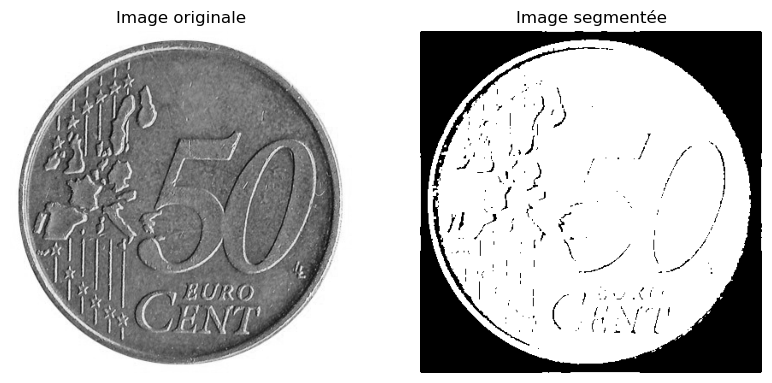


Traitement de l'image 9


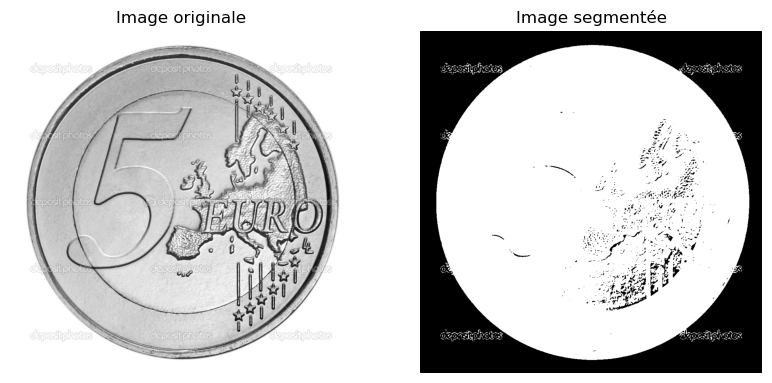


Traitement de l'image 10


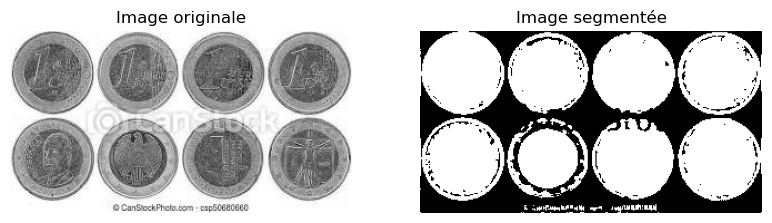

In [3]:
# Segmentation avec la methode otsu sur les images pretraiter
import numpy as np  
import matplotlib.pyplot as plt 
import os 
# 1 Charger les images 
def load_images_from_folder(folder_path, max_images=None):
    images = []
    count = 0
    for filename in os.listdir(folder_path):
        if filename.endswith(('.png', '.jpg', '.jpeg')):  
            img_path = os.path.join(folder_path, filename)
            img = plt.imread(img_path)
            if img is not None:
                if img.ndim == 3:  
                    img = np.mean(img, axis=2).astype(np.uint8)
                images.append(img)
                count += 1
                if max_images is not None and count >= max_images:  
                    break
    return images

# 2 les methodes de prétraitement 
def histogram_equalization(image):
    histogram = compute_histogram(image)
    cdf = np.cumsum(histogram)  # Calcul du cumulatif de l'histogramme
    cdf_normalized = (cdf - cdf.min()) / (cdf.max() - cdf.min()) * 255  # Normalisation
    equalized_image = cdf_normalized[image]  # Remplacer les pixels par la CDF égalisée
    return equalized_image.astype(np.uint8)

def mean_filter(image, kernel_size=3):
    pad_size = kernel_size // 2
    padded_image = np.pad(image, pad_width=pad_size, mode='constant', constant_values=0)
    filtered_image = np.zeros_like(image)
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            region = padded_image[i:i + kernel_size, j:j + kernel_size]
            filtered_image[i, j] = np.mean(region)
    return filtered_image.astype(np.uint8)

# 3 Segmentation : Méthode d'Otsu

def compute_histogram(image): # Calculer l'histogramme d'une image
    histogram = np.zeros(256, dtype=int) 
    for pixel_value in image.ravel():
        histogram[pixel_value] += 1  
    return histogram

def otsu_thresholding(image):
    histogram = compute_histogram(image)
    total_pixels = image.size
    current_max, threshold = 0, 0
    sum_total, sum_foreground, weight_background = 0.0, 0.0, 0.0
    sum_total = np.sum([i * histogram[i] for i in range(256)]) # Calcul total des intensités

    for i in range(256):
        weight_background += histogram[i]
        if weight_background == 0:
            continue
        weight_foreground = total_pixels - weight_background
        if weight_foreground == 0:
            break
        sum_foreground += i * histogram[i]
        mean_background = sum_foreground / weight_background
        mean_foreground = (sum_total - sum_foreground) / weight_foreground
         # Variance interclasse
        between_class_variance = weight_background * weight_foreground * (mean_background - mean_foreground) ** 2
        # Trouver le seuil qui maximise la variance interclasse
        if between_class_variance > current_max:
            current_max = between_class_variance
            threshold = i
# Si la valeur du pixel est < au seuil, on lui attribue une valeur de 255 (blanc) sinon 0 (noir)
    binary_image = (image < threshold).astype(np.uint8) * 255 
    return binary_image

def main():
    folder_path = "euro_coins"  
    max_images = 10  # Nombre maximal d'images à charger
    images = load_images_from_folder(folder_path, max_images=max_images)
    
    for i, image in enumerate(images):
        print(f"\nTraitement de l'image {i+1}")
        
        preprocessed_image = histogram_equalization(image)
      # preprocessed_image = adjust_contrast(preprocessed_image, alpha=1.2, beta=-10)
      # preprocessed_image = saturate_image(preprocessed_image, lower_bound=50, upper_bound=200)
      # preprocessed_image = log_enhancement(preprocessed_image)
      # preprocessed_image = power_transformation(preprocessed_image, gamma=0.5) 
        preprocessed_image = mean_filter(preprocessed_image, kernel_size=3)
        
        #la segmentation 
        segmented_image = otsu_thresholding(preprocessed_image)

        # Affichage des images avant et après la segmentation
        plt.figure(figsize=(15, 10))
        plt.subplot(1, 3, 1)
        plt.title("Image originale")
        plt.axis('off')
        plt.imshow(image, cmap='gray')
        
        plt.subplot(1, 3, 2)
        plt.title("Image segmentée")
        plt.axis('off')
        plt.imshow(segmented_image, cmap='gray')
        
        plt.show()

if __name__ == "__main__":
    main()


Traitement de l'image 1


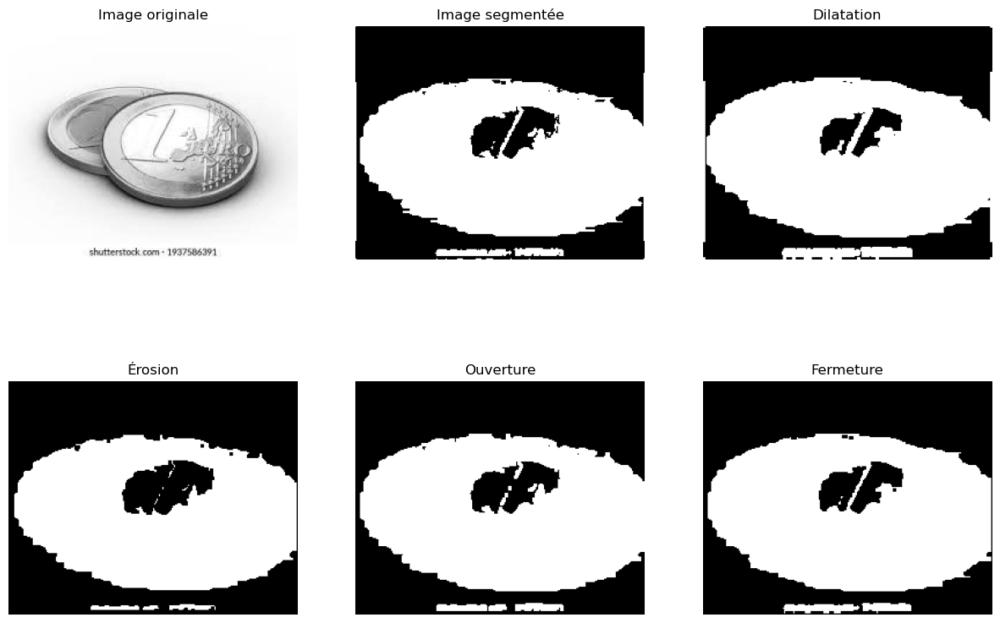


Traitement de l'image 2


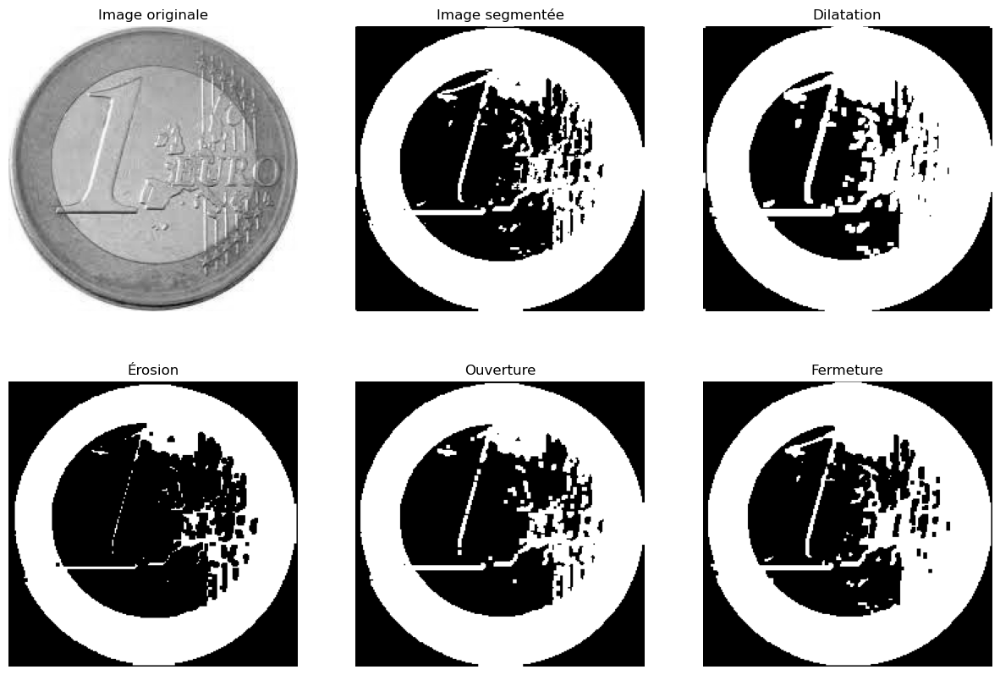


Traitement de l'image 3


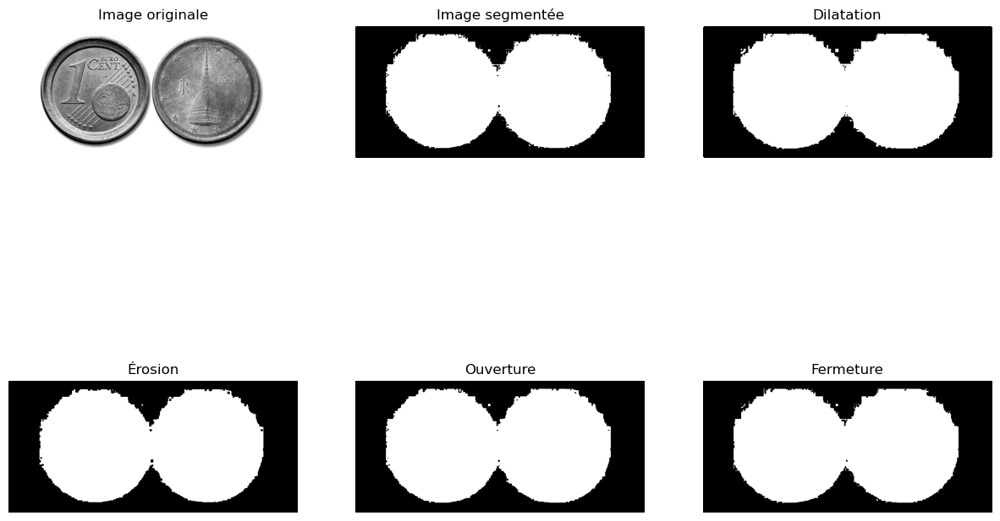


Traitement de l'image 4


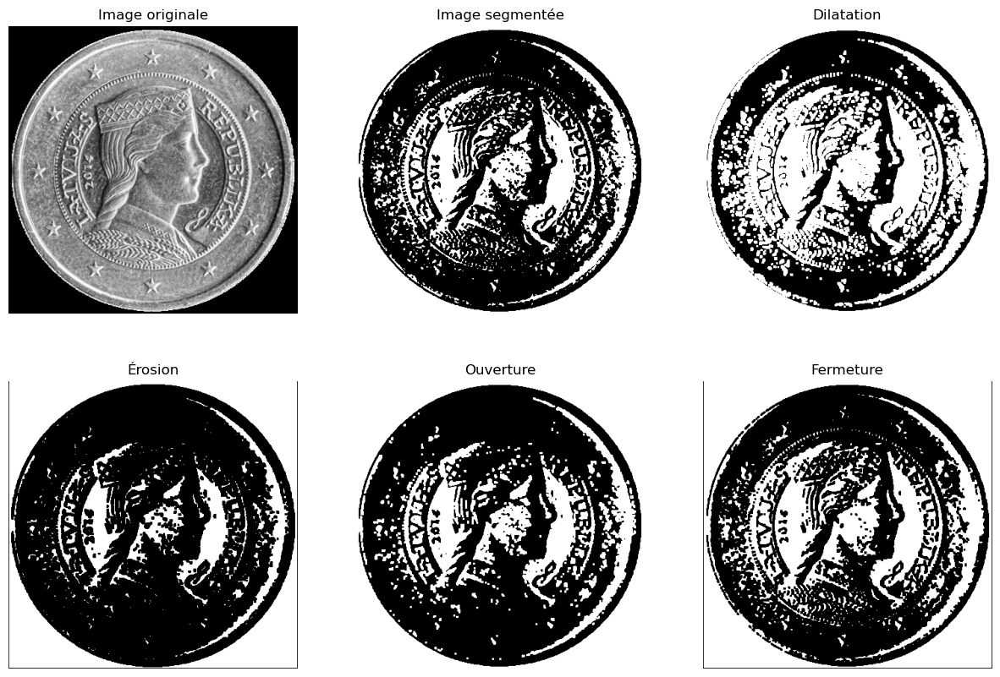


Traitement de l'image 5


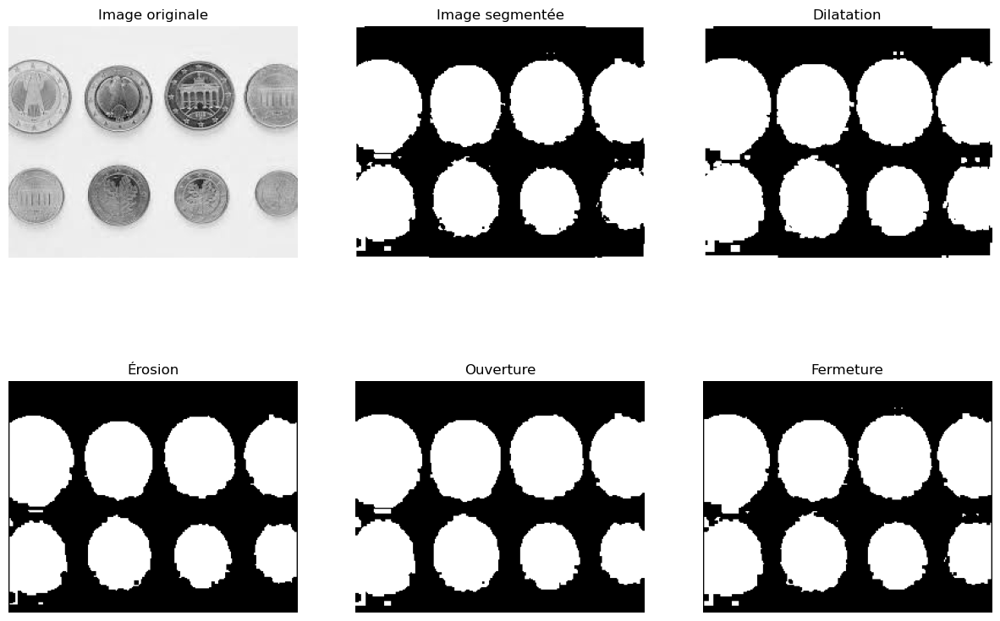


Traitement de l'image 6


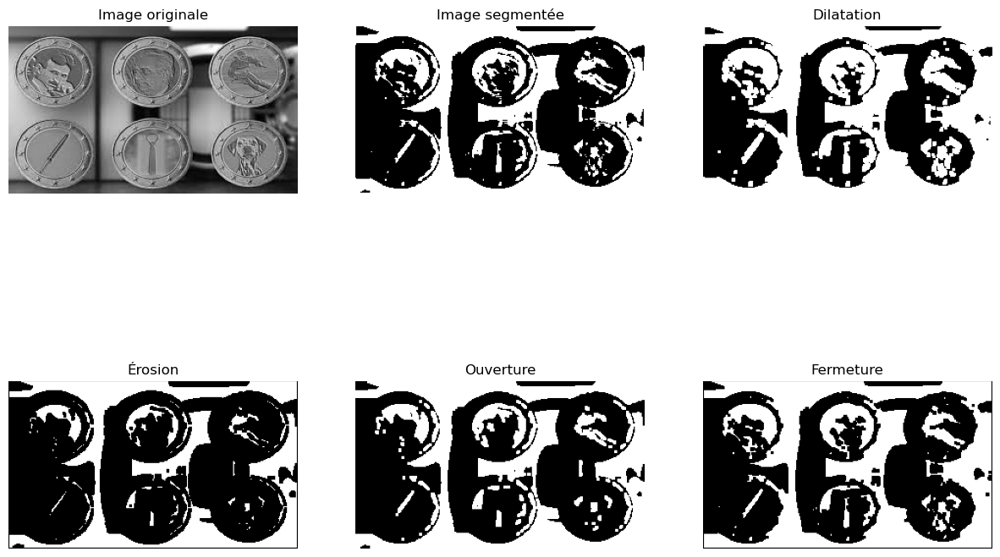


Traitement de l'image 7


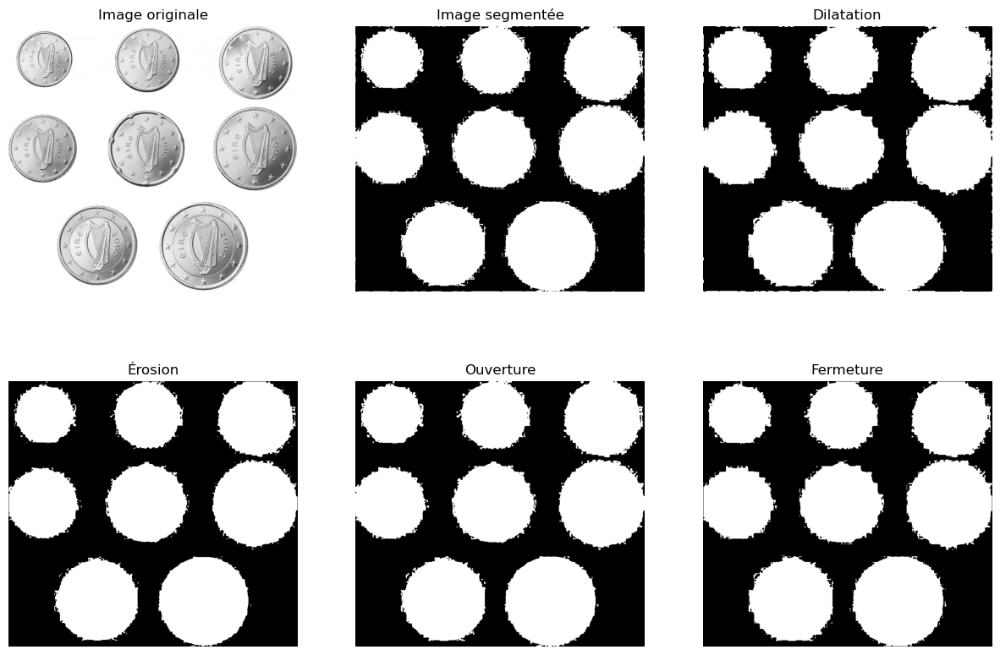


Traitement de l'image 8


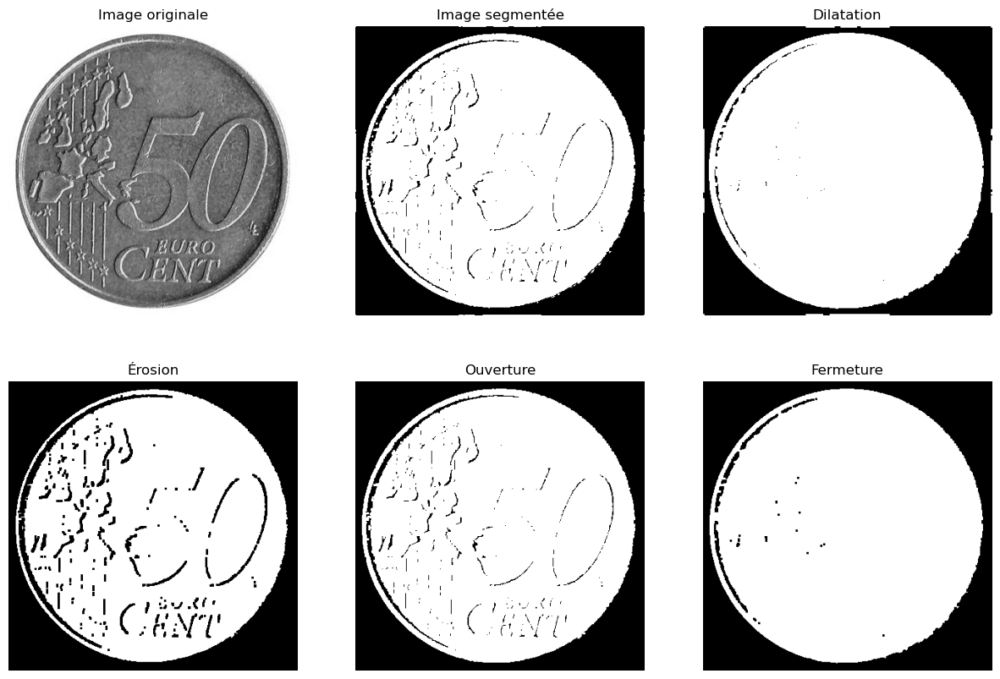


Traitement de l'image 9


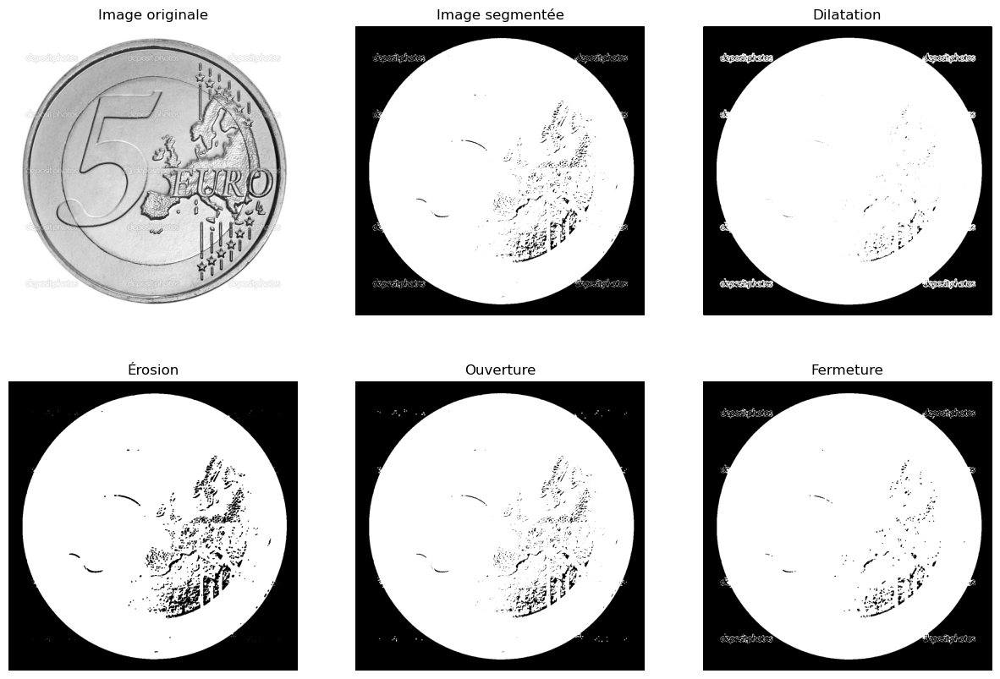


Traitement de l'image 10


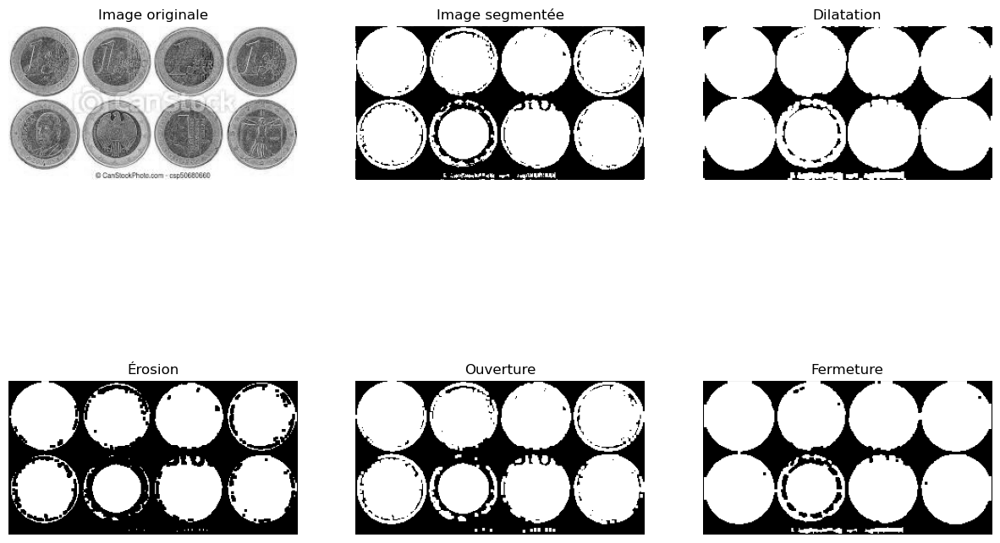

In [4]:
# Application des opérateurs morphologiques indépendament et affichage des images 
import numpy as np  
import matplotlib.pyplot as plt 
import os 
# 1 Charger les images 
def load_images_from_folder(folder_path, max_images=None):
    images = []
    count = 0
    for filename in os.listdir(folder_path):
        if filename.endswith(('.png', '.jpg', '.jpeg')):  # Filtrer uniquement les fichiers d'image
            img_path = os.path.join(folder_path, filename)
            img = plt.imread(img_path)
            if img is not None:
                if img.ndim == 3:  # Convertir l'image couleur en niveaux de gris
                    img = np.mean(img, axis=2).astype(np.uint8)
                images.append(img)
                count += 1
                if max_images is not None and count >= max_images:  # Limiter le nombre d'images chargées
                    break
    return images

# 2 les methodes de prétraitement
def histogram_equalization(image):
    histogram = compute_histogram(image)
    cdf = np.cumsum(histogram)  # Calcul du cumulatif de l'histogramme
    cdf_normalized = (cdf - cdf.min()) / (cdf.max() - cdf.min()) * 255  # Normalisation
    equalized_image = cdf_normalized[image]  # Remplacer les pixels par la CDF égalisée
    return equalized_image.astype(np.uint8)

def mean_filter(image, kernel_size=3):
    pad_size = kernel_size // 2
    padded_image = np.pad(image, pad_width=pad_size, mode='constant', constant_values=0)
    filtered_image = np.zeros_like(image)
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            region = padded_image[i:i + kernel_size, j:j + kernel_size]
            filtered_image[i, j] = np.mean(region)
    return filtered_image.astype(np.uint8)

# 3 Segmentation : Méthode d'Otsu

def compute_histogram(image): # Calculer l'histogramme d'une image
    histogram = np.zeros(256, dtype=int) 
    for pixel_value in image.ravel():
        histogram[pixel_value] += 1  
    return histogram

def otsu_thresholding(image):
    histogram = compute_histogram(image)
    total_pixels = image.size
    current_max, threshold = 0, 0
    sum_total, sum_foreground, weight_background = 0.0, 0.0, 0.0
    sum_total = np.sum([i * histogram[i] for i in range(256)])

    for i in range(256):
        weight_background += histogram[i]
        if weight_background == 0:
            continue
        weight_foreground = total_pixels - weight_background
        if weight_foreground == 0:
            break
        sum_foreground += i * histogram[i]
        mean_background = sum_foreground / weight_background
        mean_foreground = (sum_total - sum_foreground) / weight_foreground
        between_class_variance = weight_background * weight_foreground * (mean_background - mean_foreground) ** 2
        if between_class_variance > current_max:
            current_max = between_class_variance
            threshold = i
# Si la valeur du pixel est < au seuil, on lui attribue une valeur de 255 (blanc) sinon 0 (noir)
    binary_image = (image < threshold).astype(np.uint8) * 255 
    return binary_image

# 4 Opération de Dilatation
def dilate(image, struct_element):
    padded_image = np.pad(image, pad_width=struct_element.shape[0]//2, mode='constant', constant_values=0)
    dilated_image = np.zeros_like(image)

    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            region = padded_image[i:i + struct_element.shape[0], j:j + struct_element.shape[1]]
            if np.any(region & struct_element):
                dilated_image[i, j] = 1
    return dilated_image * 255

# 5 Opération d'Érosion
def erode(image, struct_element):
    padded_image = np.pad(image, pad_width=struct_element.shape[0]//2, mode='constant', constant_values=0)
    eroded_image = np.zeros_like(image)

    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            region = padded_image[i:i + struct_element.shape[0], j:j + struct_element.shape[1]]
            if np.all(region & struct_element):
                eroded_image[i, j] = 1
    return eroded_image * 255

# 6 Opération d'Ouverture (érosion suivie de dilatation)
def opening(image, struct_element):
    return dilate(erode(image, struct_element), struct_element)

# 7 Opération de Fermeture (dilatation suivie d'érosion)
def closing(image, struct_element):
    return erode(dilate(image, struct_element), struct_element)

def main():
    folder_path = "euro_coins"  
    max_images = 10  # Nombre maximal d'images à charger
    images = load_images_from_folder(folder_path, max_images=max_images)
    
    # Définir un élément structurant (carré 3x3)
    struct_element = np.array([[1, 1, 1], [1, 1, 1], [1, 1, 1]])

    for i, image in enumerate(images):
        print(f"\nTraitement de l'image {i+1}")
        
        preprocessed_image = histogram_equalization(image)
       # preprocessed_image = adjust_contrast(preprocessed_image, alpha=1.2, beta=-10)
       # preprocessed_image = saturate_image(preprocessed_image, lower_bound=50, upper_bound=200)
       # preprocessed_image = log_enhancement(preprocessed_image)
       # preprocessed_image = power_transformation(preprocessed_image, gamma=0.5) 
        preprocessed_image = mean_filter(preprocessed_image, kernel_size=3)
        
        # Application de la segmentation 
        segmented_image = otsu_thresholding(preprocessed_image)
        
        # Application des opérateurs morphologiques sur les images segmentees
        dilated_image = dilate(segmented_image, struct_element)
        eroded_image = erode(segmented_image, struct_element)
        opened_image = opening(segmented_image, struct_element)
        closed_image = closing(segmented_image, struct_element)
        
        # Affichage des images avant et après les traitements
        plt.figure(figsize=(15, 10))
        plt.subplot(2, 3, 1)
        plt.title("Image originale")
        plt.axis('off')
        plt.imshow(image, cmap='gray')
        
        plt.subplot(2, 3, 2)
        plt.title("Image segmentée")
        plt.axis('off')
        plt.imshow(segmented_image, cmap='gray')
        
        plt.subplot(2, 3, 3)
        plt.title("Dilatation")
        plt.axis('off')
        plt.imshow(dilated_image, cmap='gray')

        plt.subplot(2, 3, 4)
        plt.title("Érosion")
        plt.axis('off')
        plt.imshow(eroded_image, cmap='gray')

        plt.subplot(2, 3, 5)
        plt.title("Ouverture")
        plt.axis('off')
        plt.imshow(opened_image, cmap='gray')

        plt.subplot(2, 3, 6)
        plt.title("Fermeture")
        plt.axis('off')
        plt.imshow(closed_image, cmap='gray')
        
        plt.show()

if __name__ == "__main__":
    main()


Traitement de l'image 1


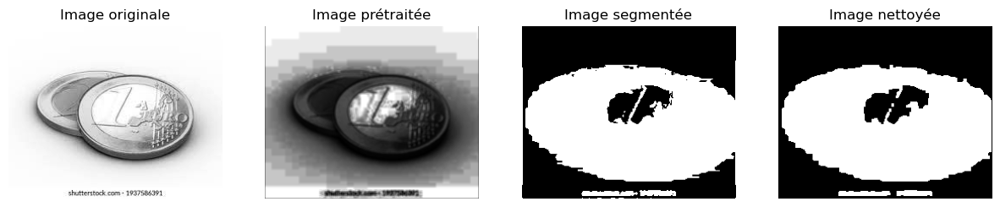


Traitement de l'image 2


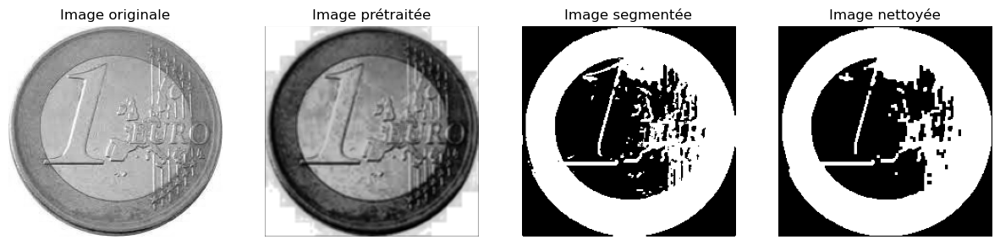


Traitement de l'image 3


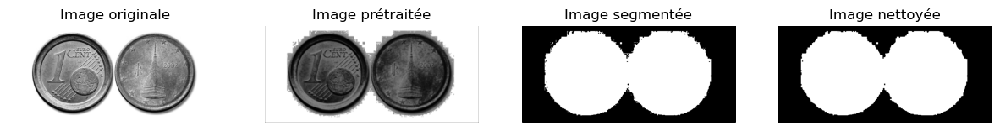


Traitement de l'image 4


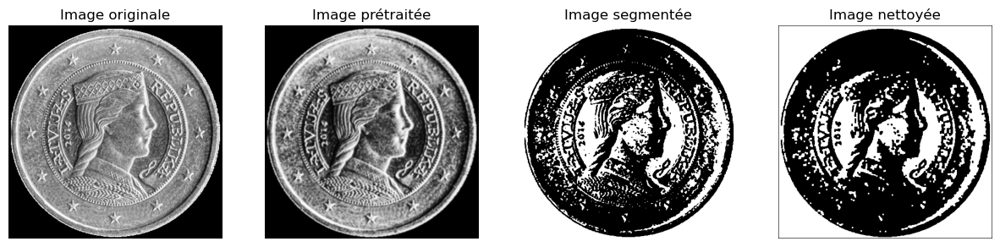


Traitement de l'image 5


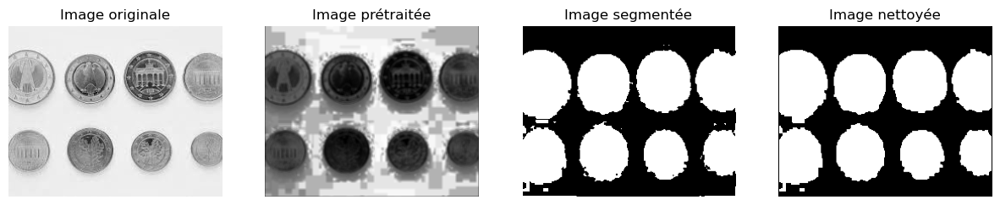


Traitement de l'image 6


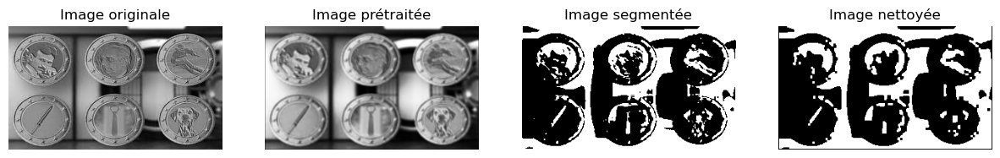


Traitement de l'image 7


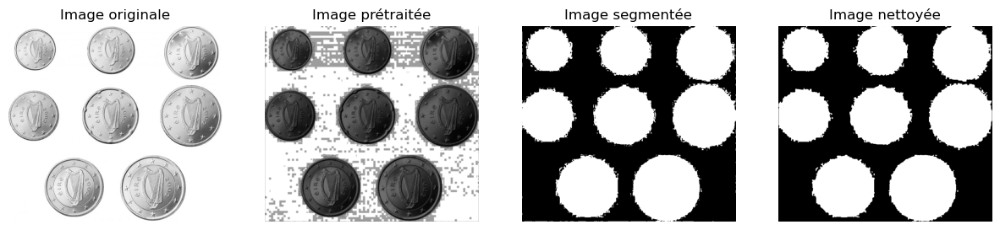


Traitement de l'image 8


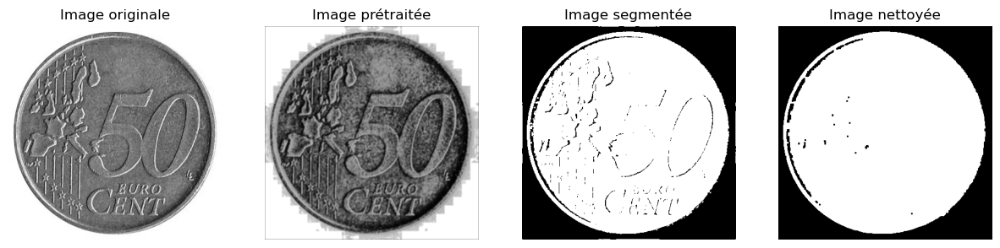


Traitement de l'image 9


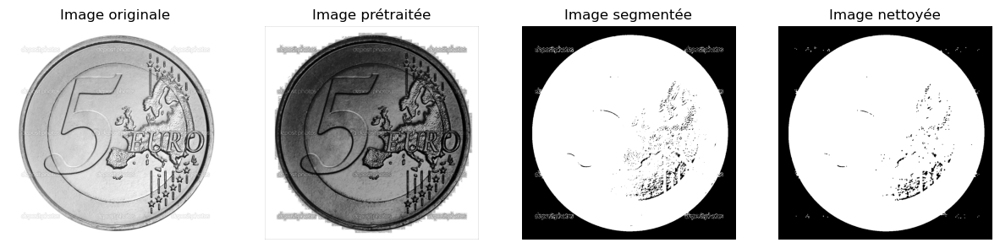


Traitement de l'image 10


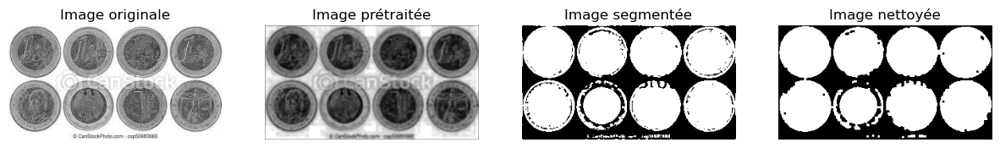

In [5]:
# Affichage d'une seule image nettoyée ( ouverture suivi d'une fermuture )
# Affichage d'une seule image pretraitée ( égalisation + filtre de lissage seulement car ca donne un meilleur résultat )
import numpy as np  
import matplotlib.pyplot as plt 
import os 
# 1 Charger les images 
def load_images_from_folder(folder_path, max_images=None):
    images = []
    count = 0
    for filename in os.listdir(folder_path):
        if filename.endswith(('.png', '.jpg', '.jpeg')): 
            img_path = os.path.join(folder_path, filename)
            img = plt.imread(img_path)
            if img is not None:
                if img.ndim == 3:  
                    img = np.mean(img, axis=2).astype(np.uint8)
                images.append(img)
                count += 1
                if max_images is not None and count >= max_images:  
                    break
    return images

# 2 Les méthodes de prétraitement

def compute_histogram(image): # Calculer l'histogramme d'une image
    histogram = np.zeros(256, dtype=int) 
    for pixel_value in image.ravel():
        histogram[pixel_value] += 1  
    return histogram

def histogram_equalization(image):
    histogram = compute_histogram(image)
    cdf = np.cumsum(histogram)  # Calcul du cumulatif de l'histogramme
    cdf_normalized = (cdf - cdf.min()) / (cdf.max() - cdf.min()) * 255  # Normalisation
    equalized_image = cdf_normalized[image]  # Remplacer les pixels par la CDF égalisée
    return equalized_image.astype(np.uint8)

def mean_filter(image, kernel_size=3):
    pad_size = kernel_size // 2
    padded_image = np.pad(image, pad_width=pad_size, mode='constant', constant_values=0)
    filtered_image = np.zeros_like(image)
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            region = padded_image[i:i + kernel_size, j:j + kernel_size]
            filtered_image[i, j] = np.mean(region)
    return filtered_image.astype(np.uint8)

# 3 Segmentation : Méthode d'Otsu
def otsu_thresholding(image):
    histogram = compute_histogram(image)
    total_pixels = image.size
    current_max, threshold = 0, 0
    sum_total, sum_foreground, weight_background = 0.0, 0.0, 0.0
    sum_total = np.sum([i * histogram[i] for i in range(256)])

    for i in range(256):
        weight_background += histogram[i]
        if weight_background == 0:
            continue
        weight_foreground = total_pixels - weight_background
        if weight_foreground == 0:
            break
        sum_foreground += i * histogram[i]
        mean_background = sum_foreground / weight_background
        mean_foreground = (sum_total - sum_foreground) / weight_foreground
        between_class_variance = weight_background * weight_foreground * (mean_background - mean_foreground) ** 2
        if between_class_variance > current_max:
            current_max = between_class_variance
            threshold = i
# Si la valeur du pixel est < au seuil, on lui attribue une valeur de 255 (blanc) sinon 0 (noir)
    binary_image = (image < threshold).astype(np.uint8) * 255 
    return binary_image

# 4 Les opérateur morphologiques
def dilate(image, struct_element):
    padded_image = np.pad(image, pad_width=struct_element.shape[0]//2, mode='constant', constant_values=0)
    dilated_image = np.zeros_like(image)

    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            region = padded_image[i:i + struct_element.shape[0], j:j + struct_element.shape[1]]
            if np.any(region & struct_element):
                dilated_image[i, j] = 1
    return dilated_image * 255

def erode(image, struct_element):
    padded_image = np.pad(image, pad_width=struct_element.shape[0]//2, mode='constant', constant_values=0)
    eroded_image = np.zeros_like(image)

    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            region = padded_image[i:i + struct_element.shape[0], j:j + struct_element.shape[1]]
            if np.all(region & struct_element):
                eroded_image[i, j] = 1
    return eroded_image * 255

def opening(image, struct_element):
    return dilate(erode(image, struct_element), struct_element)

def closing(image, struct_element):
    return erode(dilate(image, struct_element), struct_element)

def main():
    folder_path = "euro_coins"  
    max_images = 10  # Nombre maximal d'images à charger
    images = load_images_from_folder(folder_path, max_images=max_images)
    
    # Définir un élément structurant (carré 3x3)
    struct_element = np.array([[1, 1, 1], [1, 1, 1], [1, 1, 1]])

    for i, image in enumerate(images):
        print(f"\nTraitement de l'image {i+1}")
        
        preprocessed_image = histogram_equalization(image)
        # preprocessed_image = adjust_contrast(preprocessed_image, alpha=1.2, beta=-10)
        # preprocessed_image = saturate_image(preprocessed_image, lower_bound=50, upper_bound=200)
        # preprocessed_image = log_enhancement(preprocessed_image)
        # preprocessed_image = power_transformation(preprocessed_image, gamma=0.5) 
        preprocessed_image = mean_filter(preprocessed_image, kernel_size=3)
        
        # Application de la segmentation
        segmented_image = otsu_thresholding(preprocessed_image)
        
        # Application des opérateurs morphologiques sur les images segmenter
        cleaned_image = closing(opening(segmented_image, struct_element), struct_element)
        
        # Affichage des images avant et après les traitements
        plt.figure(figsize=(15, 10))
        plt.subplot(1, 4, 1)
        plt.title("Image originale")
        plt.axis('off')
        plt.imshow(image, cmap='gray')
        
        plt.subplot(1, 4, 2)
        plt.title("Image prétraitée")
        plt.imshow(preprocessed_image, cmap='gray')
        plt.axis('off')
        
        plt.subplot(1, 4, 3)
        plt.title("Image segmentée")
        plt.axis('off')
        plt.imshow(segmented_image, cmap='gray')
        
        plt.subplot(1, 4, 4)
        plt.title("Image nettoyée")
        plt.axis('off')
        plt.imshow(cleaned_image, cmap='gray')
        
        plt.show()

if __name__ == "__main__":
    main()


Traitement de l'image 1
Nombre de pièces détectées : 4


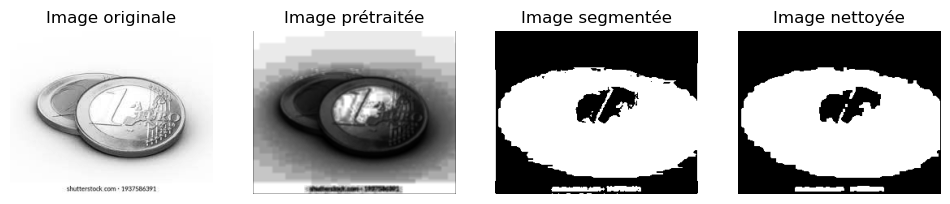


Traitement de l'image 2
Nombre de pièces détectées : 12


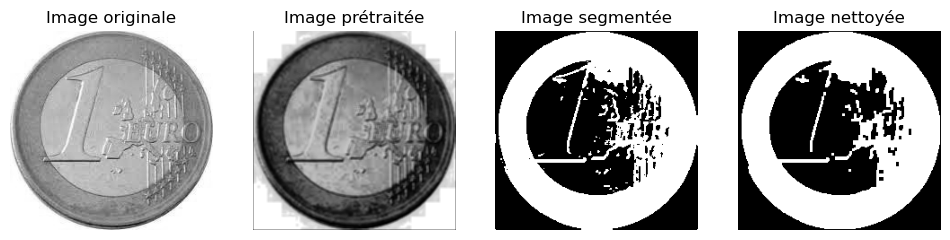


Traitement de l'image 3
Nombre de pièces détectées : 2


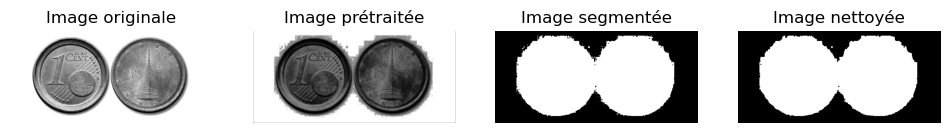


Traitement de l'image 4
Nombre de pièces détectées : 183


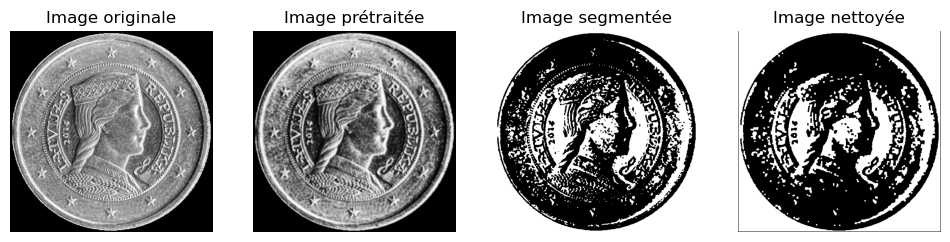


Traitement de l'image 5
Nombre de pièces détectées : 9


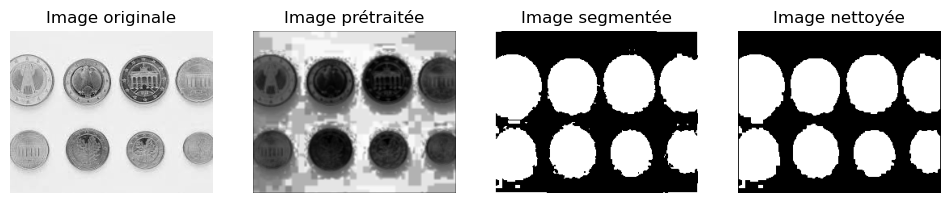


Traitement de l'image 6
Nombre de pièces détectées : 30


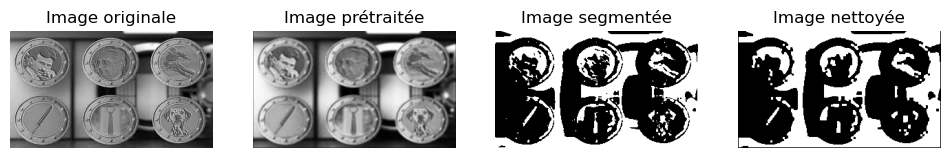


Traitement de l'image 7
Nombre de pièces détectées : 29


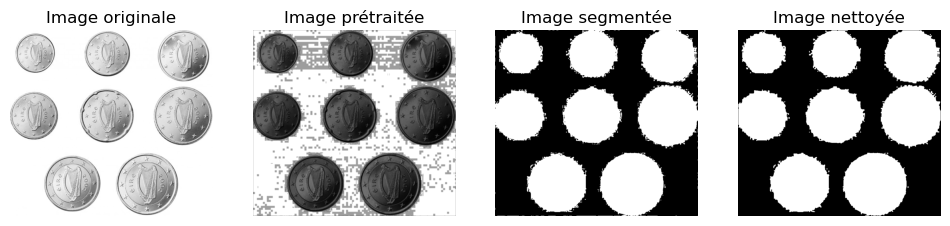


Traitement de l'image 8
Nombre de pièces détectées : 1


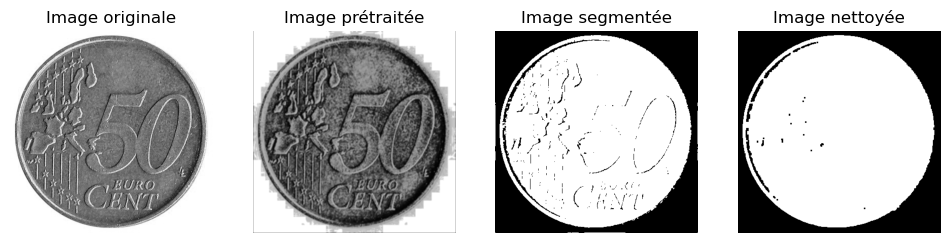


Traitement de l'image 9
Nombre de pièces détectées : 46


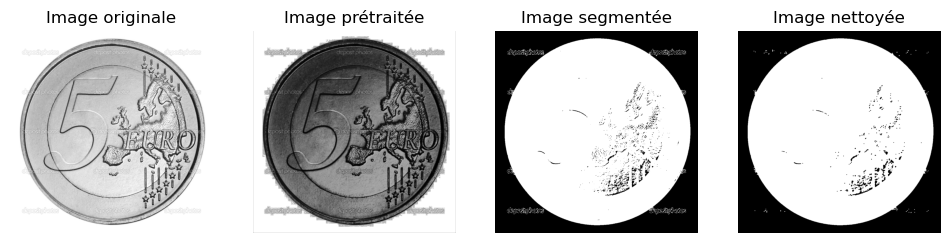


Traitement de l'image 10
Nombre de pièces détectées : 13


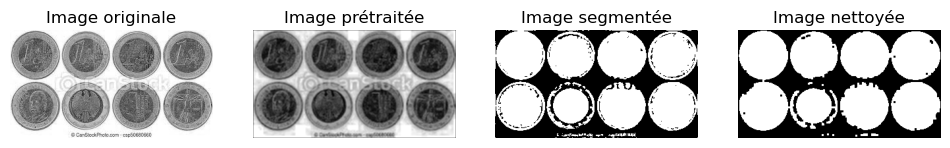

In [6]:
# Déterminer combien de pièces de monnaie sont présentes dans une image segmentée
# Chaque pièce est considérée comme une région connectée de pixels blancs 
import numpy as np
import matplotlib.pyplot as plt
import os

# 1 Charger les images
def load_images_from_folder(folder_path, max_images=None):
    images = []
    count = 0
    for filename in os.listdir(folder_path):
        if filename.endswith(('.png', '.jpg', '.jpeg')):  # Filtrer uniquement les fichiers d'image
            img_path = os.path.join(folder_path, filename)
            img = plt.imread(img_path)
            if img is not None:
                if img.ndim == 3:  # Convertir l'image couleur en niveaux de gris
                    img = np.mean(img, axis=2).astype(np.uint8)
                images.append(img)
                count += 1
                if max_images is not None and count >= max_images:
                    break
    return images

# 2 Les methodes de pretraitement
def histogram_equalization(image):
    histogram = compute_histogram(image)
    cdf = np.cumsum(histogram)  # Calcul du cumulatif de l'histogramme
    cdf_normalized = (cdf - cdf.min()) / (cdf.max() - cdf.min()) * 255  # Normalisation
    equalized_image = cdf_normalized[image]  # Remplacer les pixels par la CDF égalisée
    return equalized_image.astype(np.uint8)

def mean_filter(image, kernel_size=3):
    pad_size = kernel_size // 2
    padded_image = np.pad(image, pad_width=pad_size, mode='constant', constant_values=0)
    filtered_image = np.zeros_like(image)

    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            region = padded_image[i:i + kernel_size, j:j + kernel_size]
            filtered_image[i, j] = np.mean(region)
    return filtered_image.astype(np.uint8)

# 3 Segmentation : Méthode d'Otsu

def compute_histogram(image): # Calculer l'histogramme d'une image
    histogram = np.zeros(256, dtype=int) 
    for pixel_value in image.ravel():
        histogram[pixel_value] += 1  
    return histogram

def otsu_thresholding(image):
    histogram = np.histogram(image.flatten(), bins=256, range=(0, 256))[0]
    total_pixels = image.size
    current_max, threshold = 0, 0
    sum_total, sum_foreground, weight_background = 0.0, 0.0, 0.0
    sum_total = np.sum([i * histogram[i] for i in range(256)])

    for i in range(256):
        weight_background += histogram[i]
        if weight_background == 0:
            continue
        weight_foreground = total_pixels - weight_background
        if weight_foreground == 0:
            break
        sum_foreground += i * histogram[i]
        mean_background = sum_foreground / weight_background
        mean_foreground = (sum_total - sum_foreground) / weight_foreground
        between_class_variance = weight_background * weight_foreground * (mean_background - mean_foreground) ** 2
        if between_class_variance > current_max:
            current_max = between_class_variance
            threshold = i

    binary_image = (image < threshold).astype(np.uint8) * 255
    return binary_image

# 4 Opérations morphologiques
def dilate(image, struct_element):
    padded_image = np.pad(image, pad_width=struct_element.shape[0]//2, mode='constant', constant_values=0)
    dilated_image = np.zeros_like(image)

    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            region = padded_image[i:i + struct_element.shape[0], j:j + struct_element.shape[1]]
            if np.any(region & struct_element):
                dilated_image[i, j] = 1
    return dilated_image * 255

def erode(image, struct_element):
    padded_image = np.pad(image, pad_width=struct_element.shape[0]//2, mode='constant', constant_values=0)
    eroded_image = np.zeros_like(image)

    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            region = padded_image[i:i + struct_element.shape[0], j:j + struct_element.shape[1]]
            if np.all(region & struct_element):
                eroded_image[i, j] = 1
    return eroded_image * 255

def opening(image, struct_element):
    return dilate(erode(image, struct_element), struct_element)

def closing(image, struct_element):
    return erode(dilate(image, struct_element), struct_element)

# 5 Comptage des objets
def count_objects(binary_image): #  Compte le nombre d'objets dans une image binaire en utilisant la connectivité des pixels
    labeled_image = np.zeros_like(binary_image, dtype=int) # Créer une image pour marquer les objets détectés
    label = 1 # compteur attribue un label unique à chaque objet trouvé, initialiser le label des objets à 1
    h, w = binary_image.shape  # Récupérer les dimensions de l'image binaire

    def dfs(x, y):  #  fonction de recherche en profondeur (DFS) pour explorer un objet
        stack = [(x, y)] # Initialiser une pile avec le point de départ (x, y)
        while stack:  # Tant qu'il y a des éléments dans la pile, continuer à explorer
            cx, cy = stack.pop()  # Extraire un élément de la pile
            if 0 <= cx < h and 0 <= cy < w and binary_image[cx, cy] == 255 and labeled_image[cx, cy] == 0:
                labeled_image[cx, cy] = label
                for dx, dy in [(-1, 0), (1, 0), (0, -1), (0, 1)]:  # 4-voisinage
                    stack.append((cx + dx, cy + dy))

    for i in range(h):
        for j in range(w):
            if binary_image[i, j] == 255 and labeled_image[i, j] == 0:
                dfs(i, j)
                label += 1

    return label - 1 #  # Retourner le nombre d'objets trouvés (label commence à 1).

def main():
    folder_path = "euro_coins" 
    max_images = 10  # Nombre maximal d'images à charger
    images = load_images_from_folder(folder_path, max_images=max_images)

    # Elément structurant
    struct_element = np.array([[1, 1, 1], 
                               [1, 1, 1], 
                               [1, 1, 1]])

    for i, image in enumerate(images):
        print(f"\nTraitement de l'image {i+1}")

        # Prétraitement
        preprocessed_image = histogram_equalization(image)
        preprocessed_image = mean_filter(preprocessed_image)

        # Segmentation de l'image
        segmented_image = otsu_thresholding(preprocessed_image)

        # Application des opérateurs morphologiques 
        cleaned_image = closing(opening(segmented_image, struct_element), struct_element)
        
         # Comptage des objets
        num_objects = count_objects(cleaned_image)
        print(f"Nombre de pièces détectées : {num_objects}")
        
        # Affichage des résultats
        plt.figure(figsize=(12, 6))
        plt.subplot(1, 4, 1)
        plt.title("Image originale")
        plt.imshow(image, cmap='gray')
        plt.axis('off')

        plt.subplot(1, 4, 2)
        plt.title("Image prétraitée")
        plt.imshow(preprocessed_image, cmap='gray')
        plt.axis('off')

        plt.subplot(1, 4, 3)
        plt.title("Image segmentée")
        plt.imshow(segmented_image, cmap='gray')
        plt.axis('off')

        plt.subplot(1, 4, 4)
        plt.title("Image nettoyée")
        plt.imshow(cleaned_image, cmap='gray')
        plt.axis('off')

        plt.show()

if __name__ == "__main__":
    main()


Traitement de l'image 1
Nombre de pièces détectées : 4
Aires détectées : [24986, 12, 260, 337]
Classification des pièces : {'small': 1, 'medium': 2, 'large': 1}


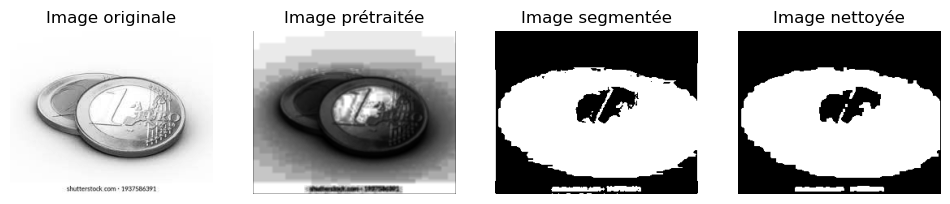


Traitement de l'image 2
Nombre de pièces détectées : 12
Aires détectées : [24257, 71, 18, 28, 204, 45, 31, 9, 43, 82, 9, 9]
Classification des pièces : {'small': 10, 'medium': 1, 'large': 1}


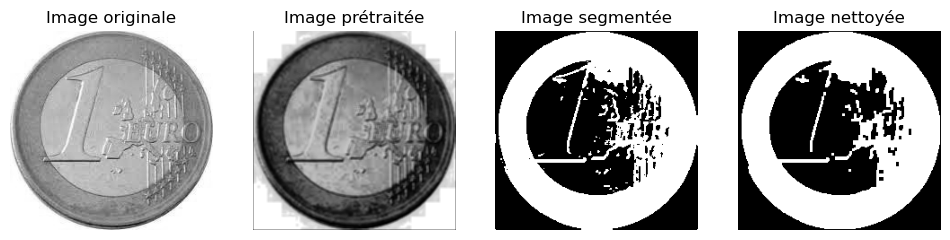


Traitement de l'image 3
Nombre de pièces détectées : 2
Aires détectées : [93970, 25]
Classification des pièces : {'small': 1, 'medium': 0, 'large': 1}


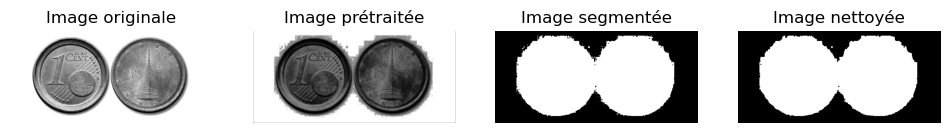


Traitement de l'image 4
Nombre de pièces détectées : 183
Aires détectées : [46109, 134, 7687, 9, 15, 9, 16, 38, 15, 9, 91, 43, 6961, 18, 27, 12, 12, 27, 12, 9, 22, 6458, 9, 9, 15, 322, 27, 9, 28, 82, 9, 15, 22, 9, 165, 9, 27, 18, 2418, 9, 25, 186, 26, 9, 83, 103, 12, 21, 32, 15, 15, 34, 16, 26, 25, 125, 9, 4379, 20, 9, 17, 638, 18, 889, 9, 36, 9, 15, 26, 24, 9, 15, 198, 179, 27, 50, 26, 12, 31, 39, 38, 14, 110, 9, 48, 31, 177, 25, 12, 225, 14, 15, 21, 60, 9, 32, 222, 83, 12, 9, 9, 19, 114, 414, 147, 23, 25, 178, 69, 89, 9, 375, 69, 22, 543, 9, 9, 15, 32, 128, 31, 29, 100, 30, 26, 9, 27, 17, 9, 163, 12, 9, 71, 14, 70, 31, 32, 22, 215, 9, 9, 9, 55, 45, 23, 64, 19, 15, 9, 14, 40, 34, 18, 27, 12, 9, 16, 103, 20, 14, 9, 9, 9, 9, 9, 18, 9, 22, 17, 19, 28, 9, 56, 48, 9, 9, 48, 9, 45, 9, 9, 9, 9]
Classification des pièces : {'small': 168, 'medium': 8, 'large': 7}


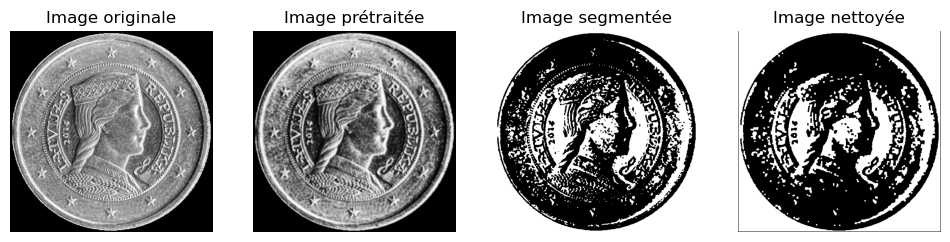


Traitement de l'image 5
Nombre de pièces détectées : 9
Aires détectées : [2779, 3954, 3730, 3517, 2956, 2933, 2329, 1698, 24]
Classification des pièces : {'small': 1, 'medium': 0, 'large': 8}


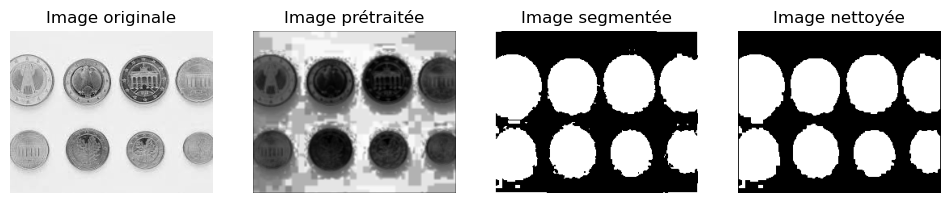


Traitement de l'image 6
Nombre de pièces détectées : 30
Aires détectées : [16506, 9, 1054, 916, 22, 612, 53, 12, 35, 12, 9, 9, 58, 12, 39, 54, 51, 21, 162, 118, 132, 57, 57, 68, 89, 22, 9, 35, 9, 9]
Classification des pièces : {'small': 26, 'medium': 1, 'large': 3}


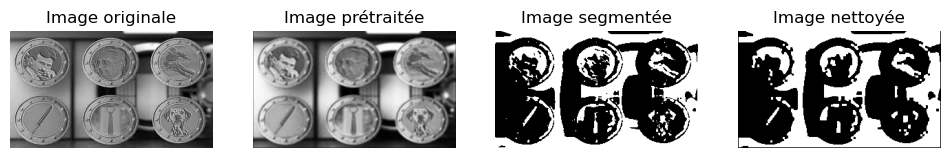


Traitement de l'image 7
Nombre de pièces détectées : 29
Aires détectées : [22930, 29744, 36, 37641, 16, 18, 47, 15, 12, 9, 15, 47495, 40981, 18, 19, 32075, 9, 12, 12, 30, 15, 9, 43933, 51729, 22, 65, 15, 27, 24]
Classification des pièces : {'small': 21, 'medium': 0, 'large': 8}


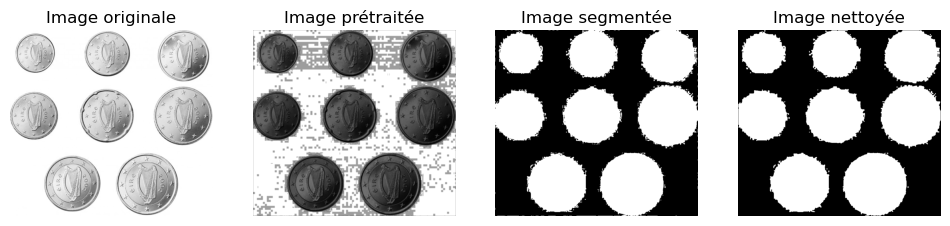


Traitement de l'image 8
Nombre de pièces détectées : 1
Aires détectées : [110620]
Classification des pièces : {'small': 0, 'medium': 0, 'large': 1}


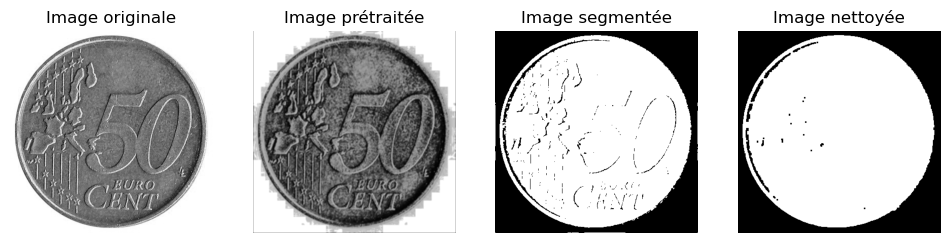


Traitement de l'image 9
Nombre de pièces détectées : 46
Aires détectées : [685992, 30, 12, 24, 9, 18, 9, 9, 39, 9, 15, 17, 9, 9, 12, 12, 22, 9, 9, 23, 9, 15, 12, 12, 9, 9, 9, 9, 9, 15, 9, 9, 18, 18, 9, 9, 9, 9, 30, 12, 12, 12, 9, 9, 16, 9]
Classification des pièces : {'small': 45, 'medium': 0, 'large': 1}


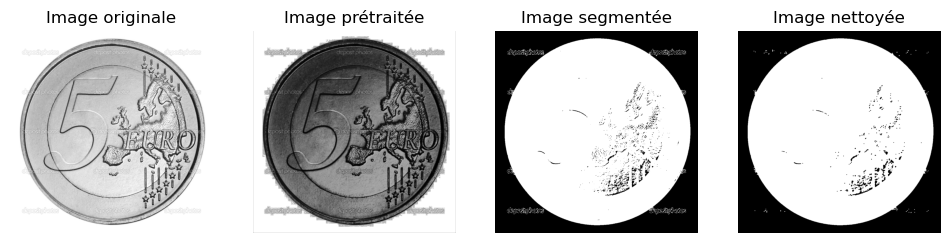


Traitement de l'image 10
Nombre de pièces détectées : 13
Aires détectées : [11514, 3974, 8511, 22, 4011, 4257, 9, 9, 40, 40, 9, 9, 9]
Classification des pièces : {'small': 8, 'medium': 0, 'large': 5}


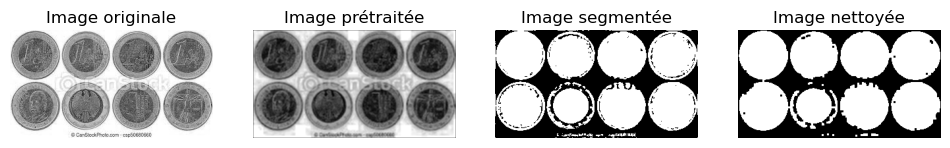

In [9]:
# Differencier les piéces par taille
import numpy as np
import matplotlib.pyplot as plt
import os

# 1. Charger les images
def load_images_from_folder(folder_path, max_images=None):
    images = []
    count = 0
    for filename in os.listdir(folder_path):
        if filename.endswith(('.png', '.jpg', '.jpeg')):  # Filtrer uniquement les fichiers d'image
            img_path = os.path.join(folder_path, filename)
            img = plt.imread(img_path)
            if img is not None:
                if img.ndim == 3:  # Convertir l'image couleur en niveaux de gris
                    img = np.mean(img, axis=2).astype(np.uint8)
                images.append(img)
                count += 1
                if max_images is not None and count >= max_images:
                    break
    return images

# 2 les méthodes de prétraitement
def histogram_equalization(image):
    histogram = compute_histogram(image)
    cdf = np.cumsum(histogram)  # Calcul du cumulatif de l'histogramme
    cdf_normalized = (cdf - cdf.min()) / (cdf.max() - cdf.min()) * 255  # Normalisation
    equalized_image = cdf_normalized[image]  # Remplacer les pixels par la CDF égalisée
    return equalized_image.astype(np.uint8)

def mean_filter(image, kernel_size=3):
    pad_size = kernel_size // 2
    padded_image = np.pad(image, pad_width=pad_size, mode='constant', constant_values=0)
    filtered_image = np.zeros_like(image)

    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            region = padded_image[i:i + kernel_size, j:j + kernel_size]
            filtered_image[i, j] = np.mean(region)
    return filtered_image.astype(np.uint8)

# 3 Segmentation : Méthode d'Otsu
def compute_histogram(image):
    histogram = np.zeros(256, dtype=int)
    for pixel_value in image.ravel():
        histogram[pixel_value] += 1 
    return histogram

def otsu_thresholding(image):
    histogram = np.histogram(image.flatten(), bins=256, range=(0, 256))[0]
    total_pixels = image.size
    current_max, threshold = 0, 0
    sum_total, sum_foreground, weight_background = 0.0, 0.0, 0.0
    sum_total = np.sum([i * histogram[i] for i in range(256)])

    for i in range(256):
        weight_background += histogram[i]
        if weight_background == 0:
            continue
        weight_foreground = total_pixels - weight_background
        if weight_foreground == 0:
            break
        sum_foreground += i * histogram[i]
        mean_background = sum_foreground / weight_background
        mean_foreground = (sum_total - sum_foreground) / weight_foreground
        between_class_variance = weight_background * weight_foreground * (mean_background - mean_foreground) ** 2
        if between_class_variance > current_max:
            current_max = between_class_variance
            threshold = i
    binary_image = (image < threshold).astype(np.uint8) * 255
    return binary_image

# 4 Opérations morphologiques
def dilate(image, struct_element):
    padded_image = np.pad(image, pad_width=struct_element.shape[0]//2, mode='constant', constant_values=0)
    dilated_image = np.zeros_like(image)

    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            region = padded_image[i:i + struct_element.shape[0], j:j + struct_element.shape[1]]
            if np.any(region & struct_element):
                dilated_image[i, j] = 1
    return dilated_image * 255

def erode(image, struct_element):
    padded_image = np.pad(image, pad_width=struct_element.shape[0]//2, mode='constant', constant_values=0)
    eroded_image = np.zeros_like(image)

    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            region = padded_image[i:i + struct_element.shape[0], j:j + struct_element.shape[1]]
            if np.all(region & struct_element):
                eroded_image[i, j] = 1
    return eroded_image * 255

def opening(image, struct_element):
    return dilate(erode(image, struct_element), struct_element)

def closing(image, struct_element):
    return erode(dilate(image, struct_element), struct_element)

# 5 Comptage des objets
def count_objects(binary_image): #  Compte le nombre d'objets dans une image binaire en utilisant la connectivité des pixels.
    labeled_image = np.zeros_like(binary_image, dtype=int)
    label = 1
    h, w = binary_image.shape

    def dfs(x, y):
        stack = [(x, y)]
        while stack:
            cx, cy = stack.pop()
            if 0 <= cx < h and 0 <= cy < w and binary_image[cx, cy] == 255 and labeled_image[cx, cy] == 0:
                labeled_image[cx, cy] = label
                for dx, dy in [(-1, 0), (1, 0), (0, -1), (0, 1)]: 
                    stack.append((cx + dx, cy + dy))

    for i in range(h):
        for j in range(w):
            if binary_image[i, j] == 255 and labeled_image[i, j] == 0:
                dfs(i, j)
                label += 1

    return label - 1 

# 6 Calculer les aires des objets( aire : le nombre total de pixels blancs composent la pièce)
def calculate_area(binary_image):
    labeled_image = np.zeros_like(binary_image, dtype=int) # matrice de même taille que l'image initialisée avec des zéros.
    label = 1 #Compteur pour assigner des labels uniques aux objets
    h, w = binary_image.shape
    areas = [] # Liste pour stocker les aires de chaque objet détecte

    def dfs(x, y): # détecttion avec DFS
        stack = [(x, y)]
        area = 0
        while stack:
            cx, cy = stack.pop()
            if 0 <= cx < h and 0 <= cy < w and binary_image[cx, cy] == 255 and labeled_image[cx, cy] == 0:
                labeled_image[cx, cy] = label
                area += 1
                for dx, dy in [(-1, 0), (1, 0), (0, -1), (0, 1)]:
                    stack.append((cx + dx, cy + dy))
        return area

    for i in range(h):
        for j in range(w):
            if binary_image[i, j] == 255 and labeled_image[i, j] == 0: # si un pixel est blanc et non visitè
                area = dfs(i, j) # dfs est appelée pour explorer l'objet
                areas.append(area) #L'aire retournée par dfs est ajoutée à la liste des aires areas
                label += 1

    return areas

# 7 Classifier les pièces par taille
def classify_coins(areas, thresholds): #Classe les objets détectés en petites, moyennes, et grandes pièces selon des seuils définis.
    categories = {"small": 0, "medium": 0, "large": 0} # dictionnaires 
    for area in areas:
        if area < thresholds[0]: # thresholds : le seuil
            categories["small"] += 1
        elif area < thresholds[1]:
            categories["medium"] += 1
        else:
            categories["large"] += 1
    return categories

def main():
    folder_path = "euro_coins"
    max_images = 10  # Nombre maximal d'images à charger
    images = load_images_from_folder(folder_path, max_images=max_images)

    # les seuils pour différencier les tailles
    thresholds = [200, 800]  # Petites, moyennes, grandes pièces (en pixels)

    # élément structurant
    struct_element = np.array([[1, 1, 1], 
                               [1, 1, 1], 
                               [1, 1, 1]])

    for i, image in enumerate(images):
        print(f"\nTraitement de l'image {i+1}")

        # Prétraitement
        preprocessed_image = histogram_equalization(image)
        #preprocessed_image = adjust_contrast(preprocessed_image)
        preprocessed_image = mean_filter(preprocessed_image)
        #preprocessed_image = median_filter(preprocessed_image)

        # Segmentation de l'image
        segmented_image = otsu_thresholding(preprocessed_image)

        # Application des opérateurs morphologiques (nettoyage)
        cleaned_image = closing(opening(segmented_image, struct_element), struct_element)
        
         # Comptage des objets
        num_objects = count_objects(cleaned_image)
        print(f"Nombre de pièces détectées : {num_objects}")
        
         # Calcul des aires des pièces sur l'image nettoyée
        areas = calculate_area(cleaned_image)
        print(f"Aires détectées : {areas}")

        #  Classification des pièces par taille
        categories = classify_coins(areas, thresholds)
        print(f"Classification des pièces : {categories}")
        
        # Affichage des résultats
        plt.figure(figsize=(12, 6))
        plt.subplot(1, 4, 1)
        plt.title("Image originale")
        plt.imshow(image, cmap='gray')
        plt.axis('off')

        plt.subplot(1, 4, 2)
        plt.title("Image prétraitée")
        plt.imshow(preprocessed_image, cmap='gray')
        plt.axis('off')

        plt.subplot(1, 4, 3)
        plt.title("Image segmentée")
        plt.imshow(segmented_image, cmap='gray')
        plt.axis('off')

        plt.subplot(1, 4, 4)
        plt.title("Image nettoyée")
        plt.imshow(cleaned_image, cmap='gray')
        plt.axis('off')

        plt.show()

if __name__ == "__main__":
    main()

In [15]:
# Calculer l'erreur et comparaison entre les valeurs réels et détectées dans un fichier excel
import numpy as np
import matplotlib.pyplot as plt
import os
import pandas as pd

# 1. Charger les images
def load_images_from_folder(folder_path, max_images=None):
    images = []
    count = 0
    for filename in os.listdir(folder_path):
        if filename.endswith(('.png', '.jpg', '.jpeg')):  # Filtrer uniquement les fichiers d'image
            img_path = os.path.join(folder_path, filename)
            img = plt.imread(img_path)
            if img is not None:
                if img.ndim == 3:  # Convertir l'image couleur en niveaux de gris
                    img = np.mean(img, axis=2).astype(np.uint8)
                images.append(img)
                count += 1
                if max_images is not None and count >= max_images:
                    break
    return images

# 2 les methodes de prétraitement
def histogram_equalization(image):
    histogram = compute_histogram(image)
    cdf = np.cumsum(histogram)  # Calcul du cumulatif de l'histogramme
    cdf_normalized = (cdf - cdf.min()) / (cdf.max() - cdf.min()) * 255  # Normalisation
    equalized_image = cdf_normalized[image]  # Remplacer les pixels par la CDF égalisée
    return equalized_image.astype(np.uint8)

def mean_filter(image, kernel_size=3):
    pad_size = kernel_size // 2
    padded_image = np.pad(image, pad_width=pad_size, mode='constant', constant_values=0)
    filtered_image = np.zeros_like(image)
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            region = padded_image[i:i + kernel_size, j:j + kernel_size]
            filtered_image[i, j] = np.mean(region)
    return filtered_image.astype(np.uint8)

# 3 Segmentation : Méthode d'Otsu
def compute_histogram(image):
    histogram = np.zeros(256, dtype=int)
    for pixel_value in image.ravel():
        histogram[pixel_value] += 1 
    return histogram

def otsu_thresholding(image):
    histogram = compute_histogram(image)
    total_pixels = image.size
    current_max, threshold = 0, 0
    sum_total, sum_foreground, weight_background = 0.0, 0.0, 0.0
    sum_total = np.sum([i * histogram[i] for i in range(256)])

    for i in range(256):
        weight_background += histogram[i]
        if weight_background == 0:
            continue
        weight_foreground = total_pixels - weight_background
        if weight_foreground == 0:
            break
        sum_foreground += i * histogram[i]
        mean_background = sum_foreground / weight_background
        mean_foreground = (sum_total - sum_foreground) / weight_foreground
        between_class_variance = weight_background * weight_foreground * (mean_background - mean_foreground) ** 2
        if between_class_variance > current_max:
            current_max = between_class_variance
            threshold = i
    binary_image = (image < threshold).astype(np.uint8) * 255 
    return binary_image

# 4 Les opérateurs morphologiques
def opening(image, struct_element):
    return dilate(erode(image, struct_element), struct_element)

def closing(image, struct_element):
    return erode(dilate(image, struct_element), struct_element)

# 5 Comptage des objets
def count_objects(binary_image): 
    labeled_image = np.zeros_like(binary_image, dtype=int)
    label = 1
    h, w = binary_image.shape
    def dfs(x, y):
        stack = [(x, y)]
        while stack:
            cx, cy = stack.pop()
            if 0 <= cx < h and 0 <= cy < w and binary_image[cx, cy] == 255 and labeled_image[cx, cy] == 0:
                labeled_image[cx, cy] = label
                for dx, dy in [(-1, 0), (1, 0), (0, -1), (0, 1)]: 
                    stack.append((cx + dx, cy + dy))
    for i in range(h):
        for j in range(w):
            if binary_image[i, j] == 255 and labeled_image[i, j] == 0:
                dfs(i, j)
                label += 1
    return label - 1 

# 6 Calcule l'exactitude et l'erreur pour chaque image
def calculate_accuracy(real_counts, detected_counts, image_names):
    results = [] # liste pour stocker les informations (nom de l'image, réel, détecté, exactitude, erreur) de chaque image
    for image_name, real, detected in zip(image_names, real_counts, detected_counts):
        if real == 0:  # nombre d'objet réel = 0
            accuracy = 0 if detected > 0 else 100 # exactitude = 0 ya une erreur sinon 100% 
        elif detected == 0:  # nombre d'objet détecté = 0 et réel > 0  exactitude = 0
            accuracy = 0
        else:  # Cas normal
            accuracy = 100 * real / max(real, detected)
        error = 100 - accuracy # calcule de l'erreur ( le complément de l'exactitude)
        results.append({"Image": image_name, "Réel": real, "Détecté": detected, "Exactitude (%)": round(accuracy, 2), "Erreur (%)": round(error, 2)})

# 7 Enregistrer les résultats dans un fichier Excel
    df = pd.DataFrame(results) # liste de dictionnaire est convertie en dataframe
    df.to_excel("ResultatsError.xlsx", index=False)
    print("Résultats enregistrés dans le fichier Excel")
    return df

def main():
    folder_path = "euro_coins" 
    max_images = 10  
    real_counts = [2, 1, 2, 1, 8, 6, 8, 1, 1, 8]  # nombre réel des pièces par image

    images = load_images_from_folder(folder_path, max_images=max_images)
    image_names = os.listdir(folder_path)[:max_images]

    # l'élément structurant pour les opérateurs morphologiques
    struct_element = np.array([[1, 1, 1], [1, 1, 1], [1, 1, 1]])
    detected_counts = []

    for i, image in enumerate(images):
        # Prétraitement
        preprocessed_image = histogram_equalization(image) 
        preprocessed_image = mean_filter(preprocessed_image, kernel_size=3)
        
        # Segmentation
        segmented_image = otsu_thresholding(preprocessed_image)
        cleaned_image = closing(opening(segmented_image, struct_element), struct_element)

        # Calcul des aires des objets détectés
        areas = calculate_area(cleaned_image)
        detected_counts.append(len(areas))  # Nombre de pièces détectées

    # Calcul des résultats
    results = calculate_accuracy(real_counts, detected_counts, image_names)

    # Affichage des résultats
    print("\nRésultats :")
    for result in results:
        print(result)

if __name__ == "__main__":
    main()

Résultats enregistrés dans le fichier Excel

Résultats :
Image
Réel
Détecté
Exactitude (%)
Erreur (%)


In [18]:
# Interface graphique avec Tkinter pour charger une image et  afficher le résultat de la segmentation et du comptage des pièces de monnaie 
import tkinter as tk
from tkinter import filedialog
from tkinter import ttk
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.backends.backend_tkagg import FigureCanvasTkAgg

# Charger une image
def load_image():
    global original_image, binary_image, detected_count
    filepath = filedialog.askopenfilename(filetypes=[("Image files", "*.jpg *.png *.jpeg")])
    if not filepath:
        return

    # Charger l'image
    img = plt.imread(filepath)
    if img.ndim == 3:
        img = np.mean(img, axis=2).astype(np.uint8)
    original_image = img

    struct_element = np.array([[1, 1, 1], [1, 1, 1], [1, 1, 1]])
    # Appliquer segmentation et comptage
    binary_image = otsu_thresholding(original_image)
    cleaned_image = closing(opening(binary_image, struct_element), struct_element)
    detected_count = count_objects(cleaned_image)

    # Afficher les résultats
    display_results()
    
# Il faut bien sur ajouter la partie du code du pretraitement , segmentation , operateurs morphologiques et le comptage 

# Fonction pour afficher les résultats
def display_results():
    # Effacer les cadres précédents
    for widget in frame_original.winfo_children():
        widget.destroy()
    for widget in frame_segmented.winfo_children():
        widget.destroy()

    # Afficher l'image originale
    fig_original, ax_original = plt.subplots()
    ax_original.imshow(original_image, cmap='gray')
    ax_original.set_title("Image Originale", fontsize=10)
    ax_original.axis('off')

    canvas_original = FigureCanvasTkAgg(fig_original, master=frame_original)
    canvas_original.get_tk_widget().pack()
    canvas_original.draw()

    # Afficher l'image segmentée
    fig_segmented, ax_segmented = plt.subplots()
    ax_segmented.imshow(binary_image, cmap='gray')
    ax_segmented.set_title("Image Segmentée", fontsize=10)
    ax_segmented.axis('off')

    canvas_segmented = FigureCanvasTkAgg(fig_segmented, master=frame_segmented)
    canvas_segmented.get_tk_widget().pack()
    canvas_segmented.draw()

    # Mettre à jour le résultat
    lbl_result.config(text=f"Nombre de pièces détectées : {detected_count}")

# Création de l'interface Tkinter
root = tk.Tk()
root.title("Comptage de Pièces")
root.geometry("800x600")
root.configure(bg="#f7f7f7")

# Titre principal
title = ttk.Label(root, text="Système de Comptage de Pièces", font=("Helvetica", 18, "bold"), background="#f7f7f7", foreground="#333")
title.pack(pady=10)

# Bouton pour charger une image
btn_load_image = ttk.Button(root, text="Charger une Image", command=load_image)
btn_load_image.pack(pady=10)

# Cadres pour afficher les images
frame_images = tk.Frame(root, bg="#f7f7f7")
frame_images.pack(pady=20)

frame_original = tk.Frame(frame_images, bg="#f7f7f7", width=350, height=350, relief=tk.SOLID, borderwidth=1)
frame_original.pack(side=tk.LEFT, padx=20)
frame_original.pack_propagate(False)

frame_segmented = tk.Frame(frame_images, bg="#f7f7f7", width=350, height=350, relief=tk.SOLID, borderwidth=1)
frame_segmented.pack(side=tk.RIGHT, padx=20)
frame_segmented.pack_propagate(False)

# Label pour le résultat
lbl_result = ttk.Label(root, text="Nombre de pièces détectées : -", font=("Helvetica", 14), background="#f7f7f7", foreground="#333")
lbl_result.pack(pady=10)

# Lancer l'application
root.mainloop()